Britton Lab - 06/09/2023 <br>

Early Polarization - Allan Deviation Plots


<font color='red'>Author: Evan McClintock

In [1]:
import numpy as np
#from numpy import linalg as la
import matplotlib.pyplot as plt
import pandas as pd
#from datetime import timedelta
import allantools #https://allantools.readthedocs.io/en/latest/functions.html
import os
#import scipy
#import copy
#import math
#import time
#import pypolar.jones as jones #https://pypolar.readthedocs.io/en/latest/05-Jones-Examples.html
#import pypolar.mueller as mueller
#import pypolar.visualization as vis
#import py_pol
#from py_pol.jones_vector import Jones_vector, degrees #https://py-pol.readthedocs.io/en/master/source/tutorial/Drawing_docs.html
#from py_pol.stokes import Stokes, create_Stokes, degrees
#import seaborn as sns
#import plotly.graph_objs as go   # For plotting 3D vectors
#from plotly.offline import iplot
#import warnings

In [115]:
import importlib
import data_manager.dataset
import data_manager.stationary
import data_manager.switch
import data_manager.plotting
import data_manager.pairs
importlib.reload(data_manager.dataset)
importlib.reload(data_manager.stationary)
importlib.reload(data_manager.switch)
importlib.reload(data_manager.plotting)
importlib.reload(data_manager.pairs)
from data_manager.dataset import Dataset
from data_manager.stationary import StationarySet
from data_manager.switch import SwitchSet
from data_manager.plotting import plot_rot_angle
from data_manager.pairs import IOPair

In [3]:
# plt.ioff() #https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.ioff.html
# plt.close('all')
BOLD_ON = "\033[1m"
BOLD_OFF = "\033[0m"
LAB = "/mnt/c/Users/2020n/Documents/Career/Locations/Britton Lab/"
DATA = LAB + "QWDM_Project/H1_Datasets/"

In [4]:
import sys
print(sys.executable)
print(sys.version)
print(sys.version_info)

/home/evanshaped/anaconda3/envs/britton2024envWSL/bin/python
3.12.2 | packaged by conda-forge | (main, Feb 16 2024, 20:50:58) [GCC 12.3.0]
sys.version_info(major=3, minor=12, micro=2, releaselevel='final', serial=0)


# Resetting reference SOPs

### Connector dataset 23-08-17

##### 1345 dataset

In [29]:
plt.ioff()
plt.close('all')

In [8]:
# filename = 'Datasets/Whole_setup/08-17/PAX_08-17_Connector_Orth_1_1345.csv'
# ds_test = Dataset(filename)
# ds_test.plot_raw(plot_param="S1",sample_range=(385,390))

Time range: min=390.004, max=7512.632
Determining change point ranges automatically...
Using change_point_range_1=(390.004, 490.004)
Using change_point_range_2=(3390.004, 3490.004)
=== performing change point detection ===
cp range: (390.004, 490.004)
using 6730 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (6730,)
computing range... ---> range = (1.70,1.75)
displaying jump_fig for switch parameter = s1



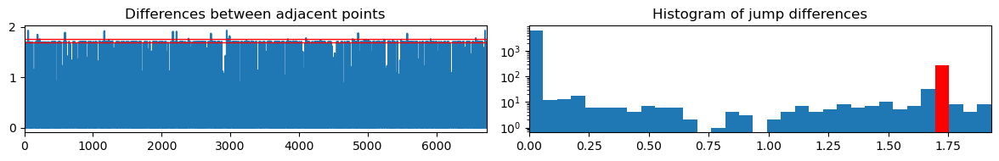



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (6730,)
computing range... ---> range = (0.83,0.89)
displaying jump_fig for switch parameter = s2



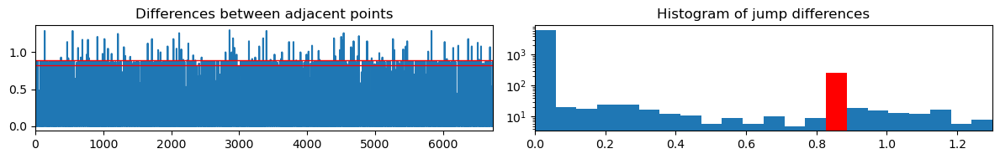



found width of 0.059 for s2
greater than prev width of 0.058 for s1
--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (6730,)
computing range... ---> range = (0.40,0.46)
displaying jump_fig for switch parameter = s3



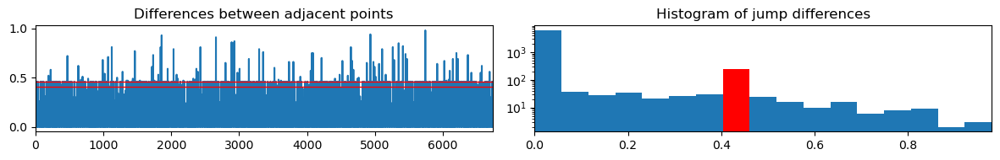



--- end of switch param: s3 ---

---> switch parameter found: s2 <---
finding differences within range = (0.83,0.89)
Jump points detected: 257
out of total: ~399.9

computing offset...


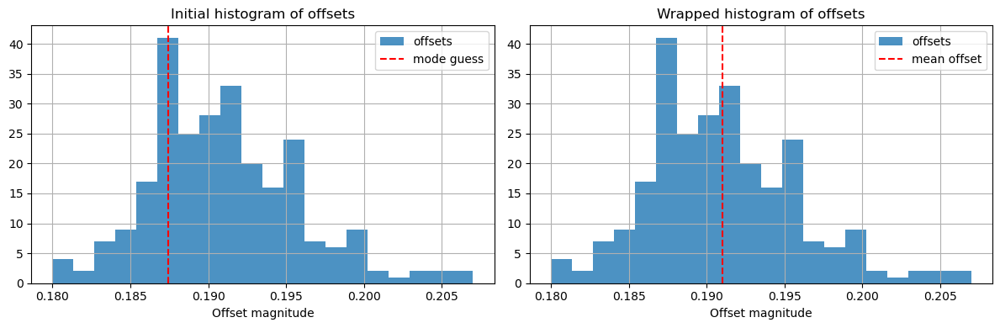



offset = 0.191 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (3390.004, 3490.004)
using 6836 data entries
skipping 203792 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (6836,)
computing range... ---> range = (1.64,1.70)
displaying jump_fig for switch parameter = s1



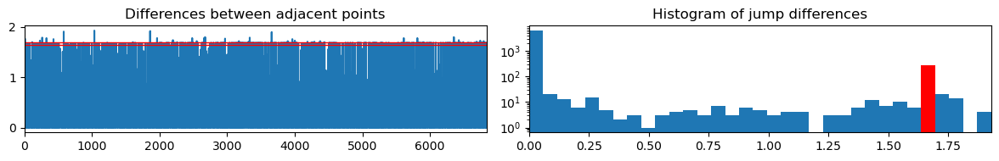



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (6836,)
computing range... ---> range = (0.93,0.99)
displaying jump_fig for switch parameter = s2



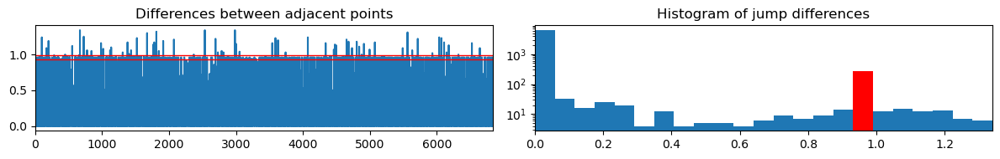



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (6836,)
computing range... ---> range = (0.29,0.34)
displaying jump_fig for switch parameter = s3



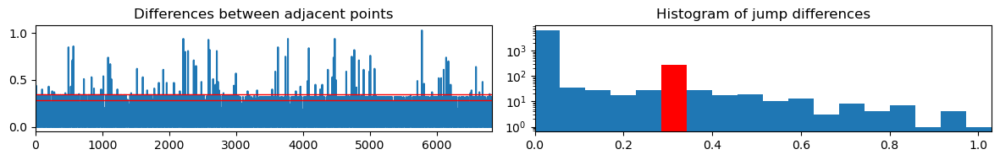



--- end of switch param: s3 ---

---> switch parameter found: s1 <---
finding differences within range = (1.64,1.70)
Jump points detected: 288
out of total: ~400.0

computing offset...


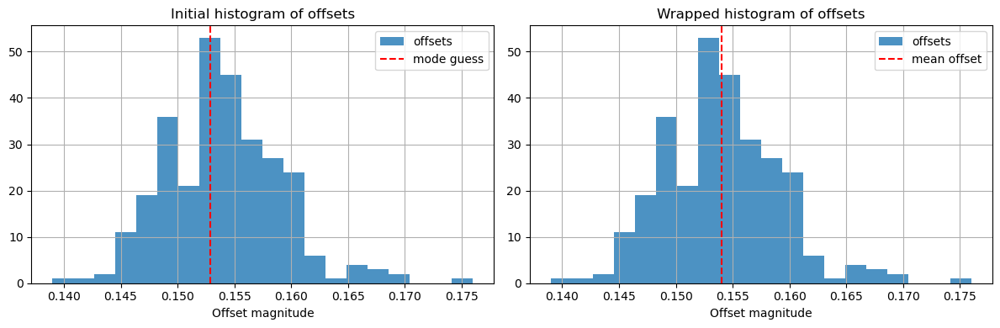



offset = 0.154 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of -0.037 seconds over 12000.0 switches
Corrected Switch Time = 0.2499969


In [31]:
filename = 'Datasets/Whole_setup/08-17/PAX_08-17_Connector_Orth_1_1345.csv'
#ds = SwitchSet(filename, skip_default_signal_baseline=14)
#ds.find_switches(nominal_switch_rate=2, change_point_range_1=(15,50), print_process=True)
ds_1345 = SwitchSet(filename, skip_default_signal_baseline=390)
ds_1345.find_switches(nominal_switch_rate=2, print_process=True)

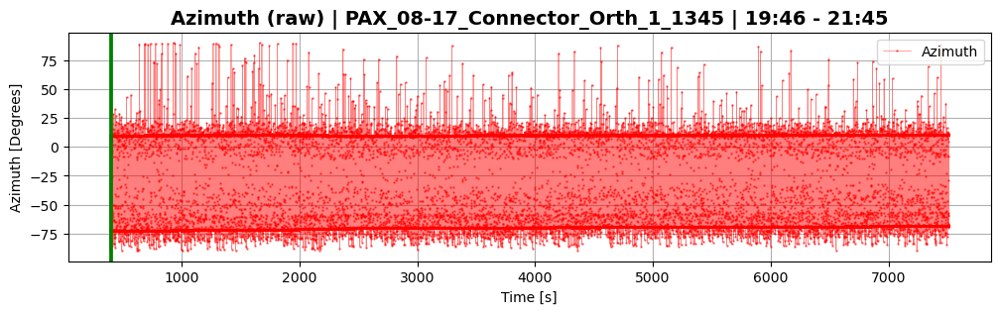

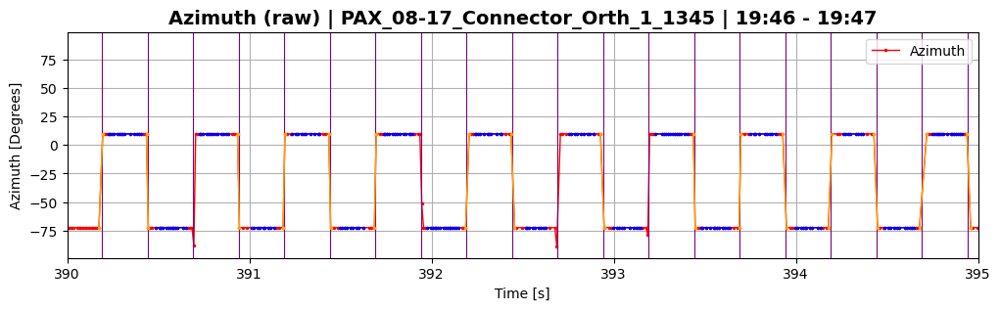

In [32]:
ds_1345.plot_raw(plot_param='Azimuth', sample_range=(390,395),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

In [33]:
ds_1345.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 38 observations with <4 points (out of total 28353 observations)

--- interpolating data ---
length before: 14158
length after: 14245
87 total added
--- end interpolating data ---

--- interpolating data ---
length before: 14157
length after: 14243
86 total added
--- end interpolating data ---
Signal 1 size=14243	Signal 1 range: t=(390.57,7511.48)
Signal 2 size=14245	Signal 2 range: t=(390.32,7512.23)
=== end average_data ===


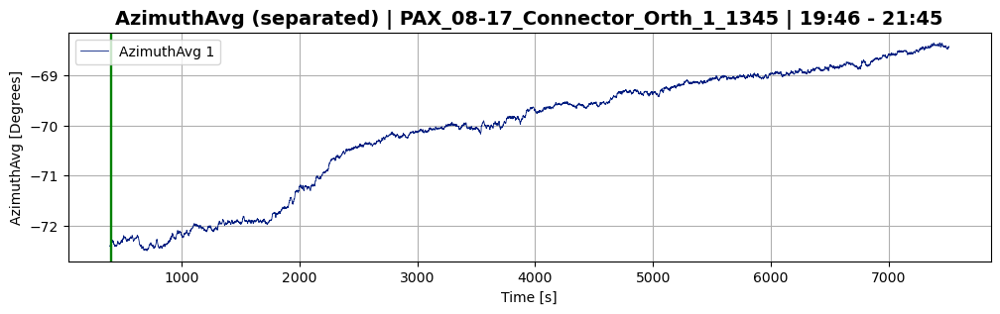

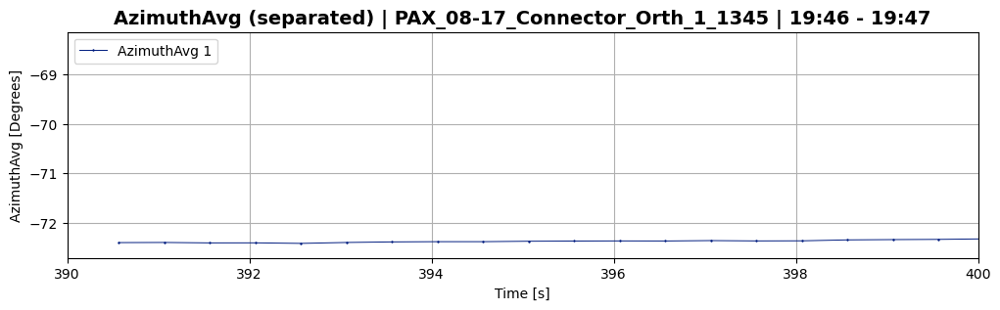

In [34]:
ds_1345.plot_separated(plot_param='AzimuthAvg',plot_signal=1,sample_range=(390,400))

In [35]:
reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=2, print_process=True);

Using "resetting reference SOPs" approach with threshold = 2.0 degrees
Reference matrix was reset 10 times
Reset at time t=570.94
Reset at time t=912.44
Reset at time t=1518.43
Reset at time t=1919.42
Reset at time t=2211.42
Reset at time t=2392.92
Reset at time t=3273.91
Reset at time t=4292.89
Reset at time t=6339.87
Reset at time t=7395.36


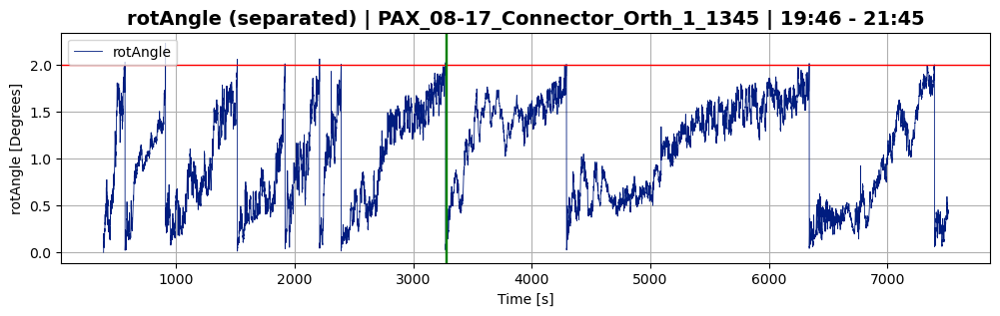

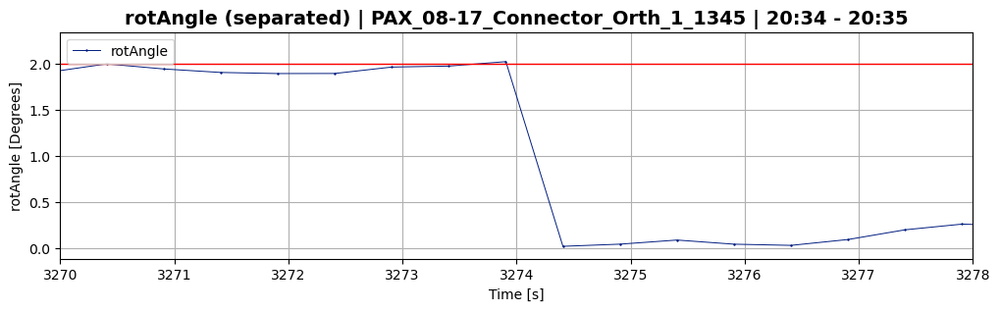

In [36]:
ds_1345.plot_separated(plot_param='rotAngle',plot_signal=1,sample_range=(3270,3278))

##### 1560 dataset

Time range: min=390.006, max=7513.214
Determining change point ranges automatically...
Using change_point_range_1=(390.006, 490.006)
Using change_point_range_2=(3390.006, 3490.006)
=== performing change point detection ===
cp range: (390.006, 490.006)
using 5473 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5473,)
computing range... ---> range = (0.71,0.77)
displaying jump_fig for switch parameter = s1



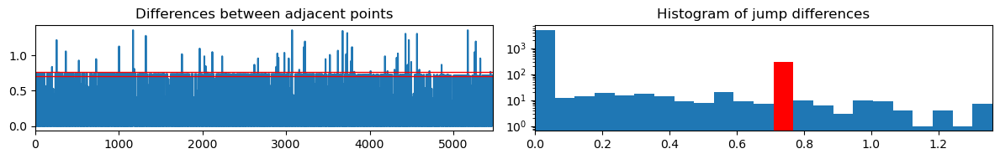



found width of 0.059 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5473,)
computing range... ---> range = (1.81,1.87)
displaying jump_fig for switch parameter = s2



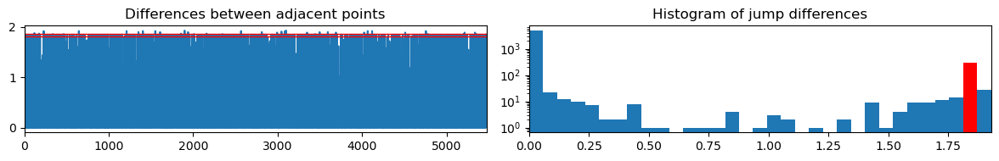



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5473,)
computing range... ---> range = (0.06,0.11)
displaying jump_fig for switch parameter = s3



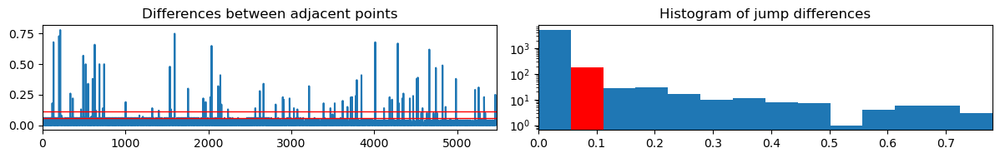



--- end of switch param: s3 ---

---> switch parameter found: s1 <---
finding differences within range = (0.71,0.77)
Jump points detected: 296
out of total: ~400.0

computing offset...


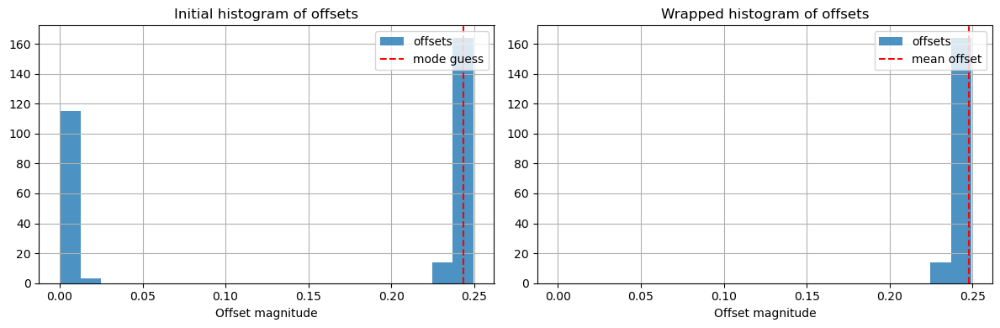



offset = 0.248 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (3390.006, 3490.006)
using 5438 data entries
skipping 164666 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5438,)
computing range... ---> range = (0.36,0.42)
displaying jump_fig for switch parameter = s1



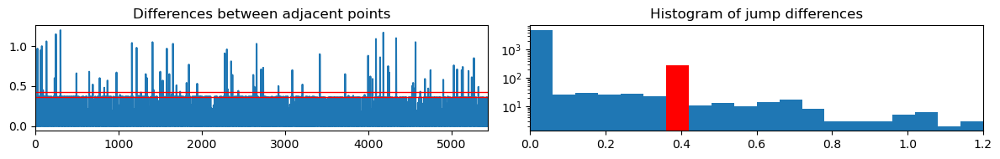



found width of 0.060 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5438,)
computing range... ---> range = (1.93,1.99)
displaying jump_fig for switch parameter = s2



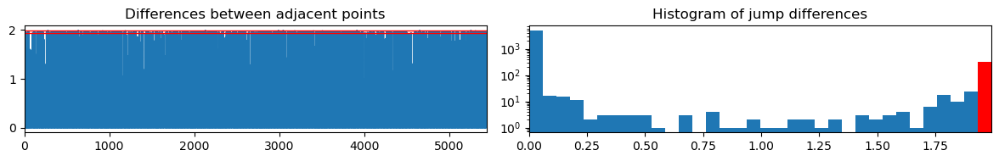



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5438,)
computing range... ---> range = (0.06,0.11)
displaying jump_fig for switch parameter = s3



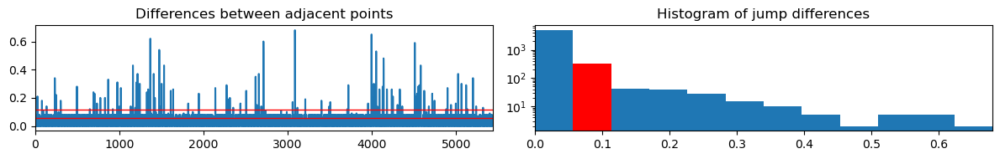



--- end of switch param: s3 ---

---> switch parameter found: s1 <---
finding differences within range = (0.36,0.42)
Jump points detected: 281
out of total: ~399.8

computing offset...


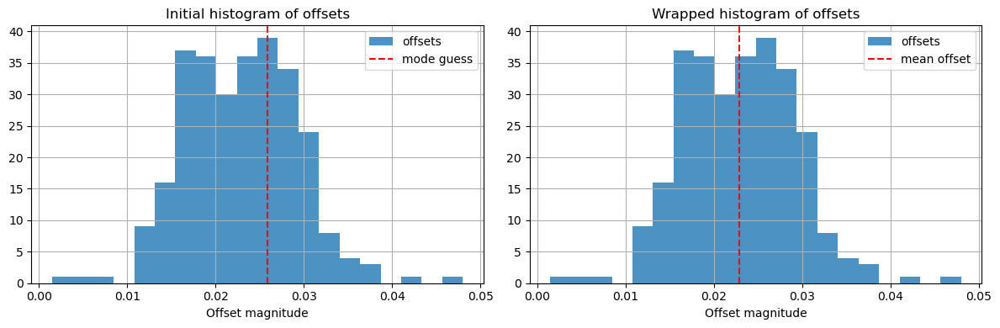



offset = 0.023 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of 0.025 seconds over 12000.0 switches
Corrected Switch Time = 0.2500021


In [37]:
filename = 'Datasets/Whole_setup/08-17/PAX_08-17_Connector_Orth_1_1560.csv'
#ds = SwitchSet(filename, skip_default_signal_baseline=14)
#ds.find_switches(nominal_switch_rate=2, change_point_range_1=(15,50), print_process=True)
ds_1560 = SwitchSet(filename, skip_default_signal_baseline=390)
ds_1560.find_switches(nominal_switch_rate=2, print_process=True)

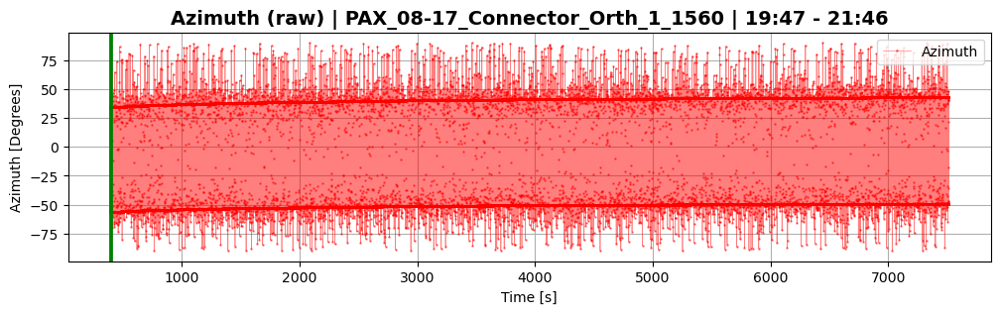

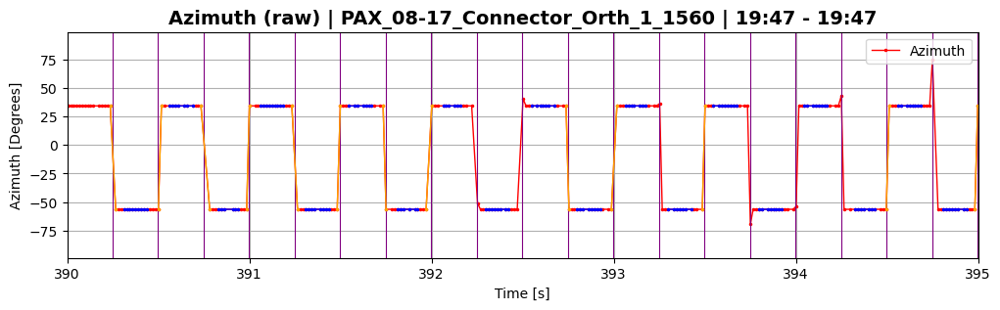

In [38]:
ds_1560.plot_raw(plot_param='Azimuth', sample_range=(390,395),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

In [39]:
ds_1560.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 6 observations with <4 points (out of total 28491 observations)

--- interpolating data ---
length before: 14243
length after: 14246
3 total added
--- end interpolating data ---

--- interpolating data ---
length before: 14242
length after: 14245
3 total added
--- end interpolating data ---
Signal 1 size=14246	Signal 1 range: t=(390.37,7512.93)
Signal 2 size=14245	Signal 2 range: t=(390.62,7512.68)
=== end average_data ===


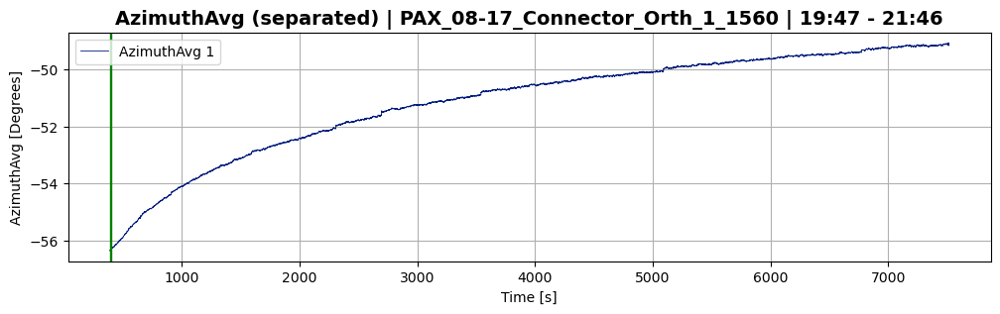

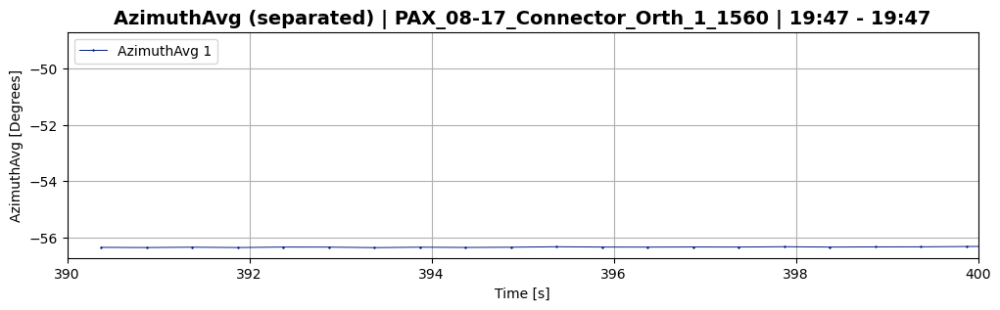

In [40]:
ds_1560.plot_separated(plot_param='AzimuthAvg',plot_signal=1,sample_range=(390,400))

In [41]:
reset_times_1560 = ds_1560.calc_stokes_ptf(reference=reset_times_1345, angle_threshold_deg=2, print_process=True);

Using provided reset times to reset reference matrix
Reference matrix was reset 10 times
Reset at time t=571.00
Reset at time t=912.50
Reset at time t=1518.51
Reset at time t=1919.51
Reset at time t=2211.51
Reset at time t=2393.01
Reset at time t=3274.02
Reset at time t=4293.03
Reset at time t=6340.05
Reset at time t=7395.56


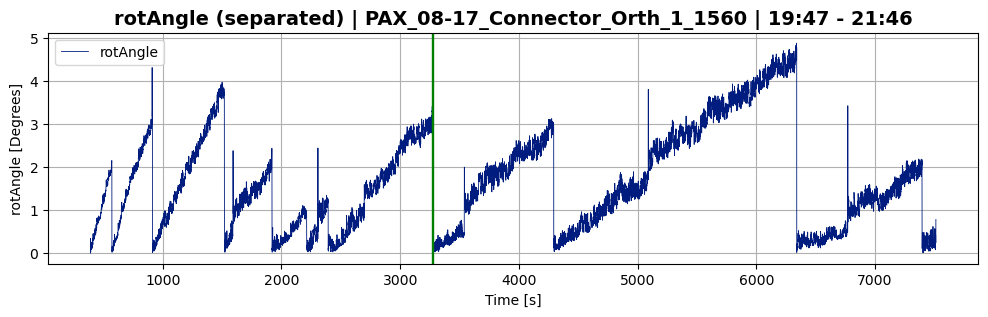

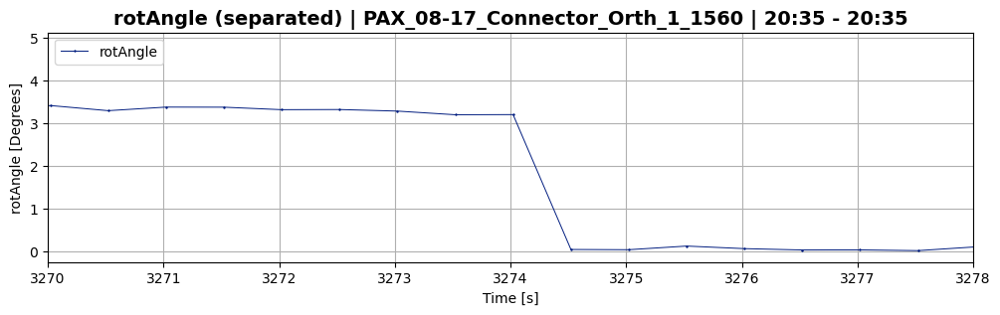

In [42]:
ds_1560.plot_separated(plot_param='rotAngle',plot_signal=1,sample_range=(3270,3278))

##### Both 1345 and 1560 rotAngle

In [44]:
ds_con_08_17 = (ds_1345, ds_1560)

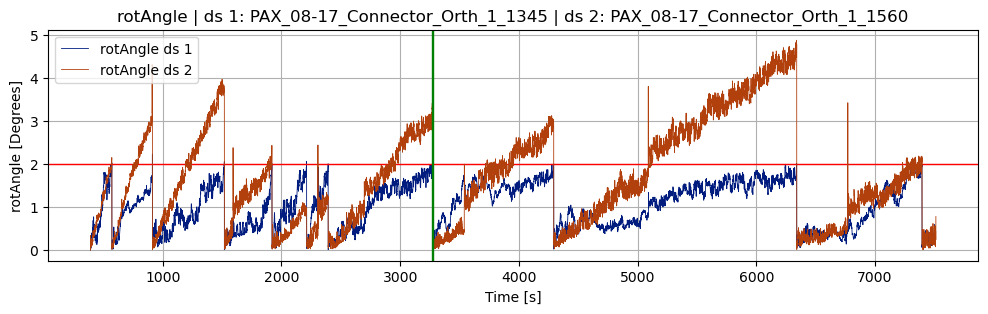

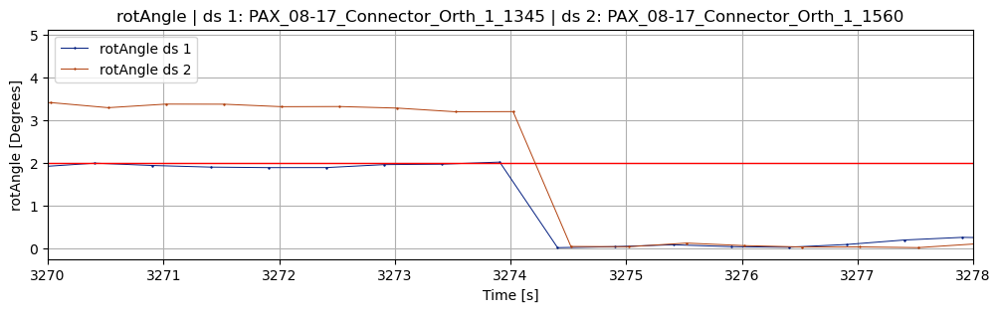

In [43]:
plot_rot_angle(ds_1345, ds_1560, birds_eye=True, sample_range=(3270,3278))

### Connector dataset 23-11-16

##### 1345 dataset

In [45]:
plt.ioff()
plt.close('all')

In [142]:
#filename = 'Datasets/Whole_setup/11-16/PAX_11-16_CON_Orth_1345_desktop.csv'
#ds_test = Dataset(filename,set_range=(0,0.01),skip_default_signal_baseline=False)

Time range: min=0.064, max=976.995


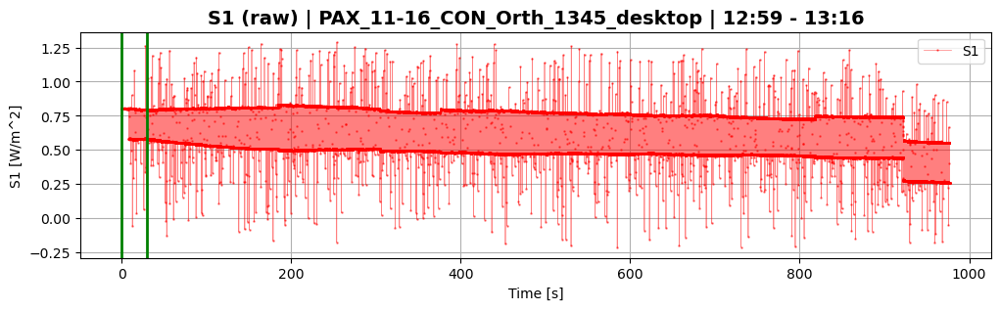

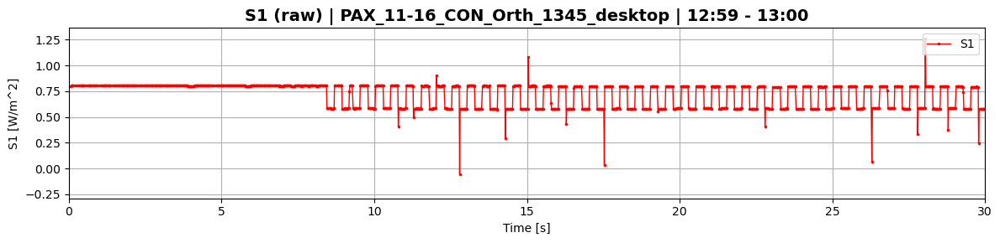

(<Figure size 1200x300 with 1 Axes>, <Figure size 1200x300 with 1 Axes>)

In [144]:
#ds_test.plot_raw(plot_param="S1",sample_range=(0,30))

Time range: min=20.012, max=4908.415
Determining change point ranges automatically...
Using change_point_range_1=(20.012, 120.012)
Using change_point_range_2=(3020.012, 3120.012)
=== performing change point detection ===
cp range: (20.012, 120.012)
using 6007 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (6007,)
computing range... ---> range = (0.18,0.24)
displaying jump_fig for switch parameter = s1



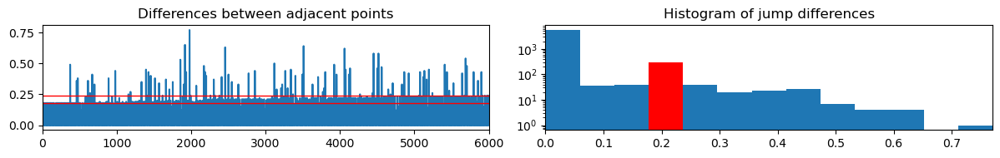



found width of 0.059 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (6007,)
computing range... ---> range = (0.06,0.12)
displaying jump_fig for switch parameter = s2



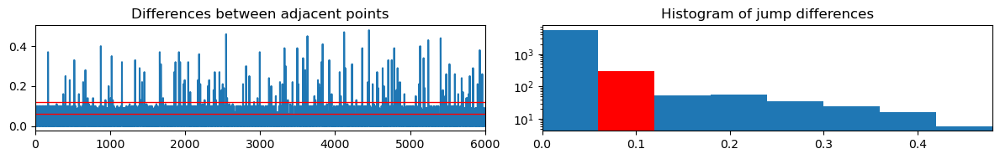



found width of 0.060 for s2
greater than prev width of 0.059 for s1
--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (6007,)
computing range... ---> range = (1.24,1.30)
displaying jump_fig for switch parameter = s3



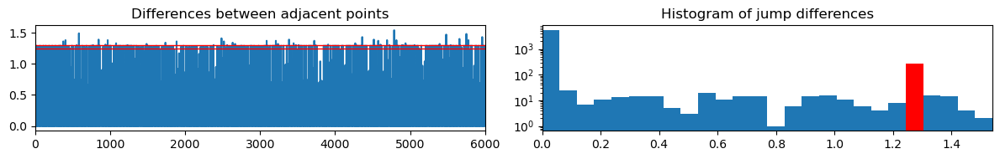



--- end of switch param: s3 ---

---> switch parameter found: s2 <---
finding differences within range = (0.06,0.12)
Jump points detected: 307
out of total: ~400.0

computing offset...


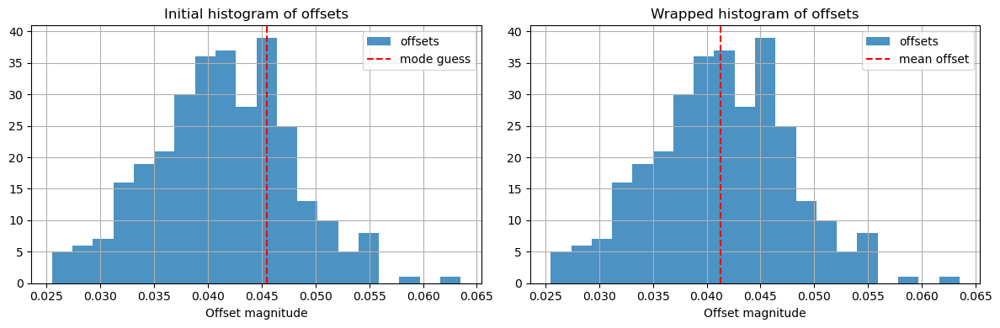



offset = 0.041 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (3020.012, 3120.012)
using 5991 data entries
skipping 179653 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5991,)
computing range... ---> range = (0.17,0.23)
displaying jump_fig for switch parameter = s1



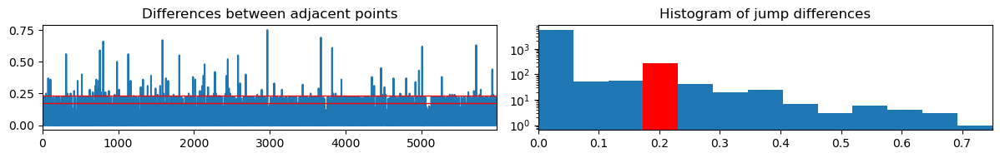



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5991,)
computing range... ---> range = (0.99,1.04)
displaying jump_fig for switch parameter = s2



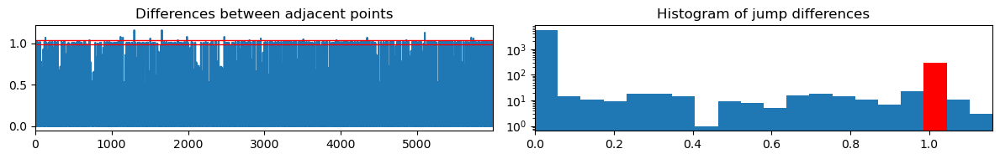



found width of 0.058 for s2
greater than prev width of 0.058 for s1
--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5991,)
computing range... ---> range = (0.86,0.92)
displaying jump_fig for switch parameter = s3



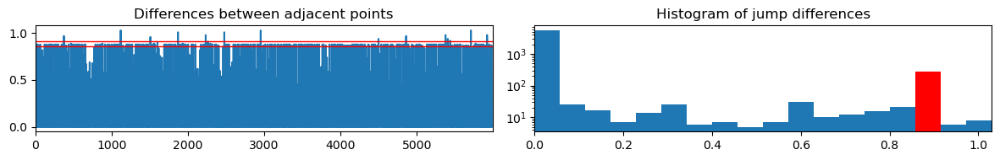



--- end of switch param: s3 ---

---> switch parameter found: s2 <---
finding differences within range = (0.99,1.04)
Jump points detected: 283
out of total: ~400.0

computing offset...


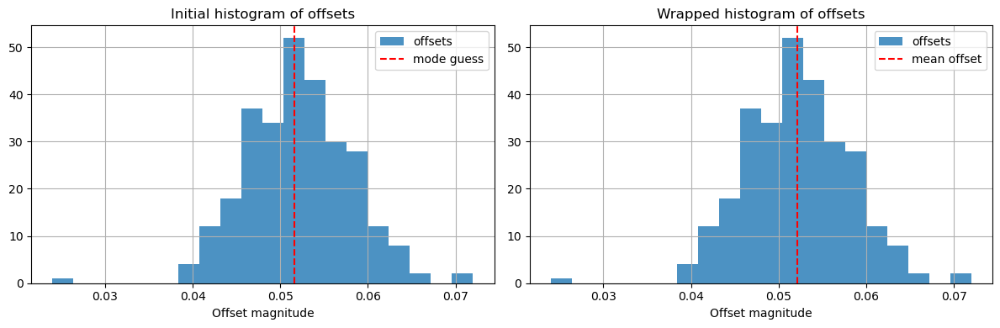



offset = 0.052 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of 0.011 seconds over 12000.0 switches
Corrected Switch Time = 0.2500009


In [145]:
filename = 'Datasets/Whole_setup/11-16/PAX_11-16_CON_Orth_1345_desktop.csv'
ds_1345 = SwitchSet(filename, set_range=(0,0.05), skip_default_signal_baseline=20)
ds_1345.find_switches(nominal_switch_rate=2, print_process=True)

In [146]:
ds_1345.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 0 observations with <4 points (out of total 19552 observations)

--- interpolating data ---
length before: 9776
length after: 9776
0 total added
--- end interpolating data ---

--- interpolating data ---
length before: 9776
length after: 9776
0 total added
--- end interpolating data ---
Signal 1 size=9776	Signal 1 range: t=(20.67,4908.18)
Signal 2 size=9776	Signal 2 range: t=(20.42,4907.93)
=== end average_data ===


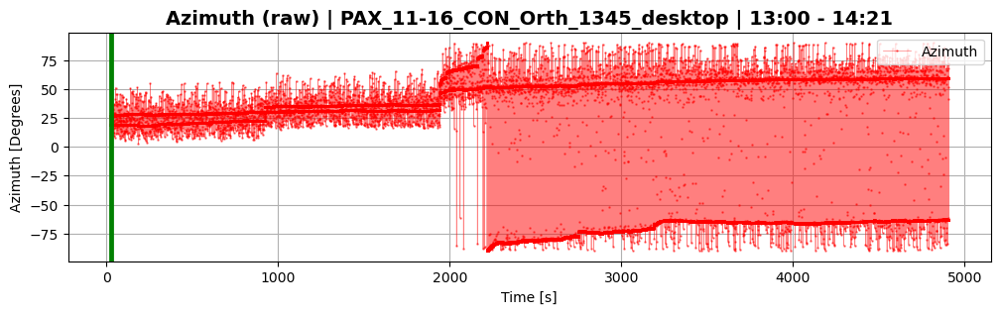

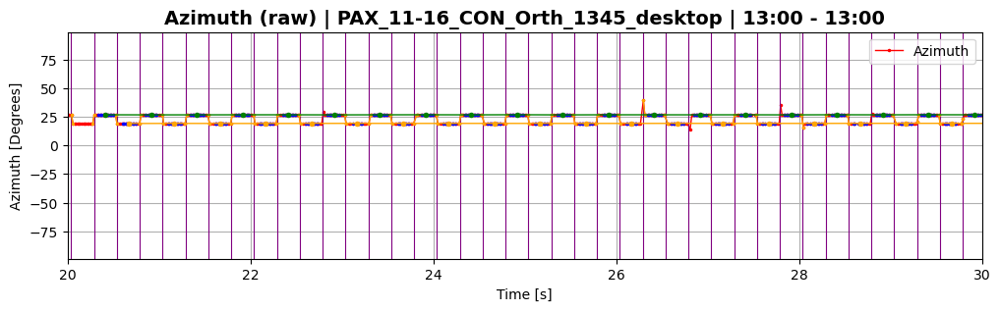

In [147]:
ds_1345.plot_raw(plot_param='Azimuth', sample_range=(20,30),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

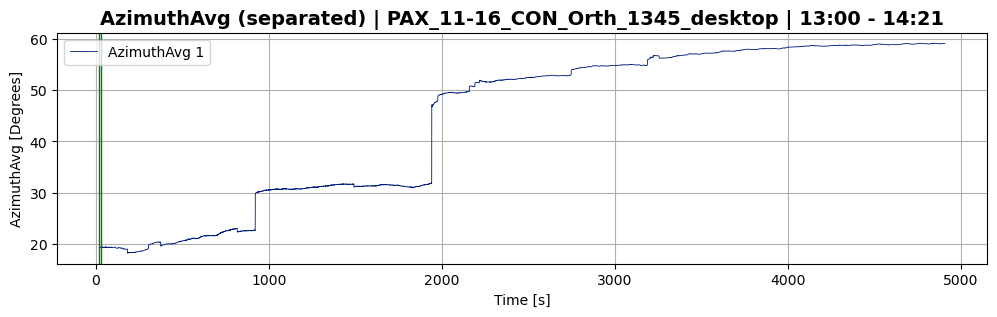

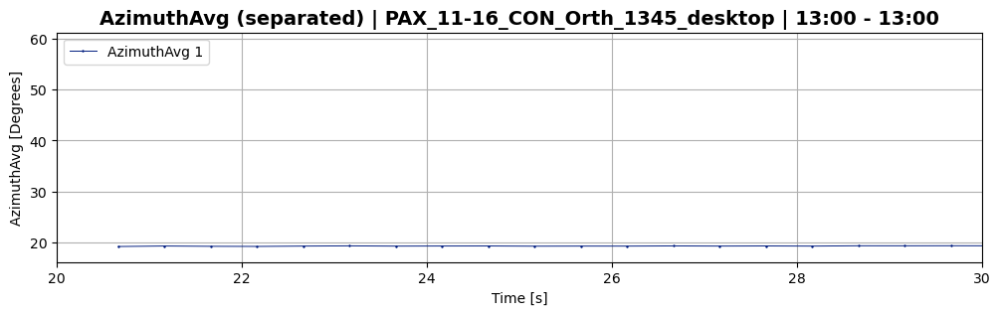

In [148]:
ds_1345.plot_separated(plot_param='AzimuthAvg',plot_signal=1,sample_range=(20,30))

In [149]:
reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=5, print_process=True);

Using "resetting reference SOPs" approach with threshold = 5.0 degrees


/tmp/ipykernel_54062/1230508500.py:983: RuntimeWarning:

invalid value encountered in arccos



Reference matrix was reset 10 times
Reset at time t=714.04
Reset at time t=922.54
Reset at time t=1664.55
Reset at time t=1942.55
Reset at time t=1977.55
Reset at time t=2162.55
Reset at time t=2525.05
Reset at time t=2875.55
Reset at time t=3224.05
Reset at time t=4494.56


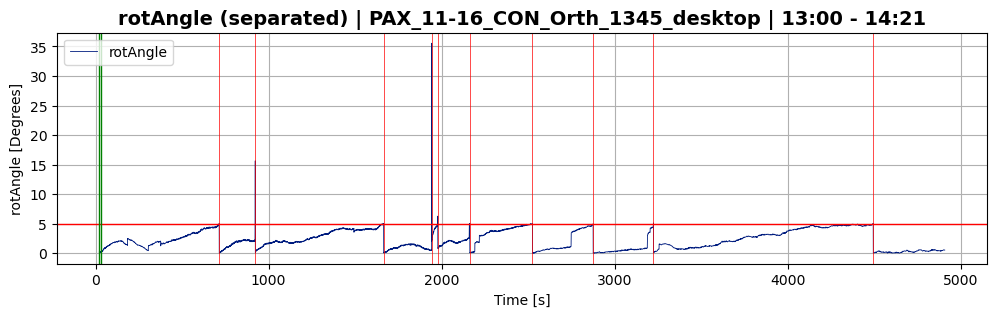

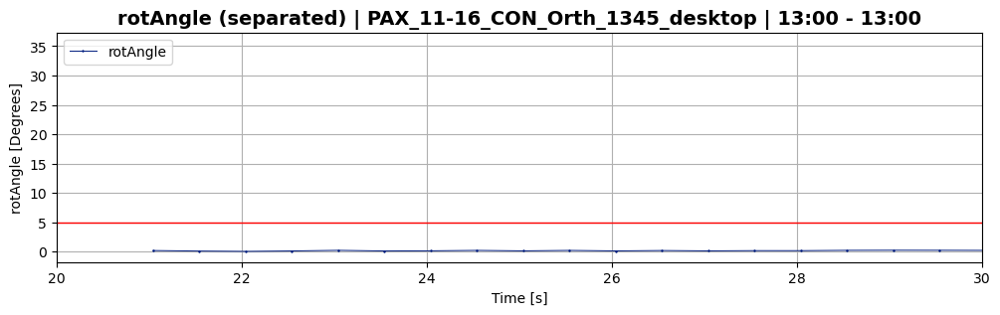

In [150]:
ds_1345.plot_separated(plot_param='rotAngle',sample_range=(20,30))

##### 1560 dataset

Time range: min=20.003, max=4845.596
Determining change point ranges automatically...
Using change_point_range_1=(20.003, 120.003)
Using change_point_range_2=(3020.003, 3120.003)
=== performing change point detection ===
cp range: (20.003, 120.003)
using 5859 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5859,)
computing range... ---> range = (0.93,0.99)
displaying jump_fig for switch parameter = s1



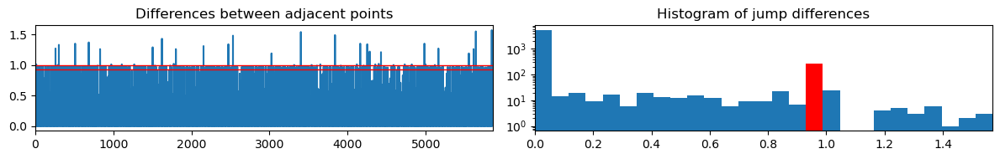



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5859,)
computing range... ---> range = (0.36,0.41)
displaying jump_fig for switch parameter = s2



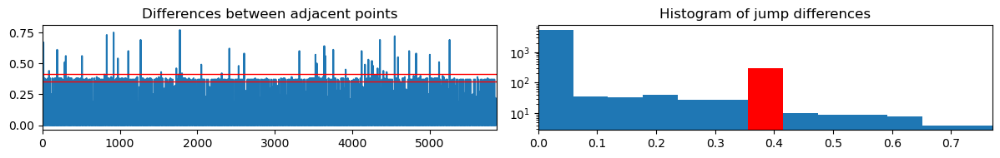



found width of 0.059 for s2
greater than prev width of 0.058 for s1
--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5859,)
computing range... ---> range = (0.91,0.97)
displaying jump_fig for switch parameter = s3



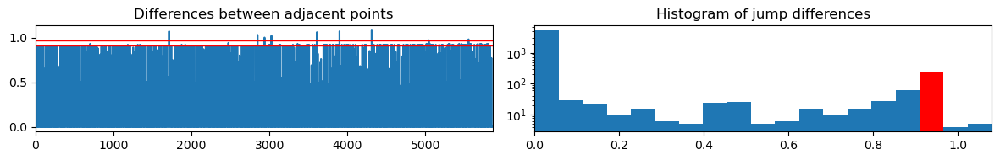



--- end of switch param: s3 ---

---> switch parameter found: s2 <---
finding differences within range = (0.36,0.41)
Jump points detected: 290
out of total: ~400.0

computing offset...


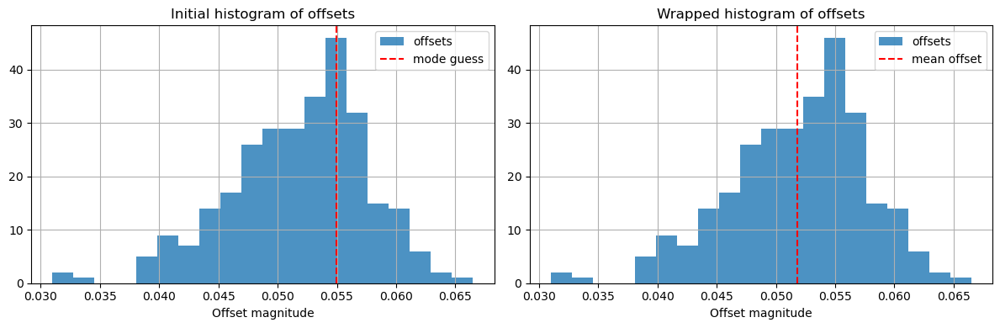



offset = 0.052 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (3020.003, 3120.003)
using 5865 data entries
skipping 176849 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5865,)
computing range... ---> range = (0.24,0.30)
displaying jump_fig for switch parameter = s1



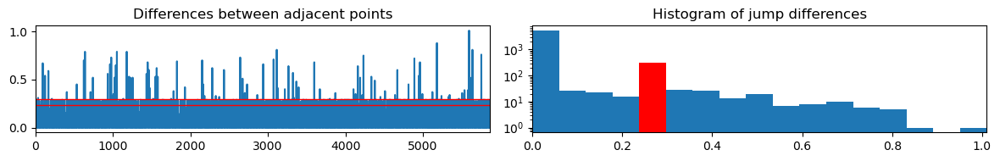



found width of 0.059 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5865,)
computing range... ---> range = (1.05,1.11)
displaying jump_fig for switch parameter = s2



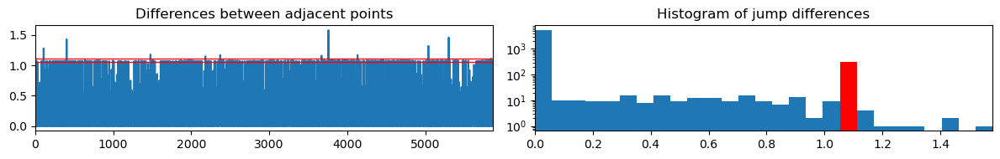



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5865,)
computing range... ---> range = (0.82,0.88)
displaying jump_fig for switch parameter = s3



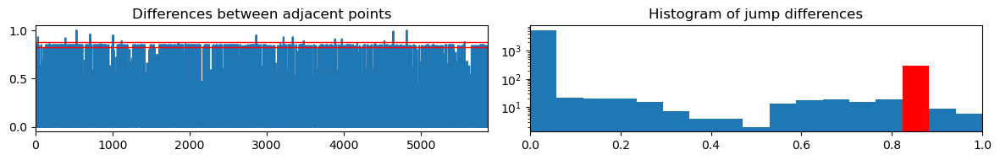



--- end of switch param: s3 ---

---> switch parameter found: s1 <---
finding differences within range = (0.24,0.30)
Jump points detected: 302
out of total: ~400.0

computing offset...


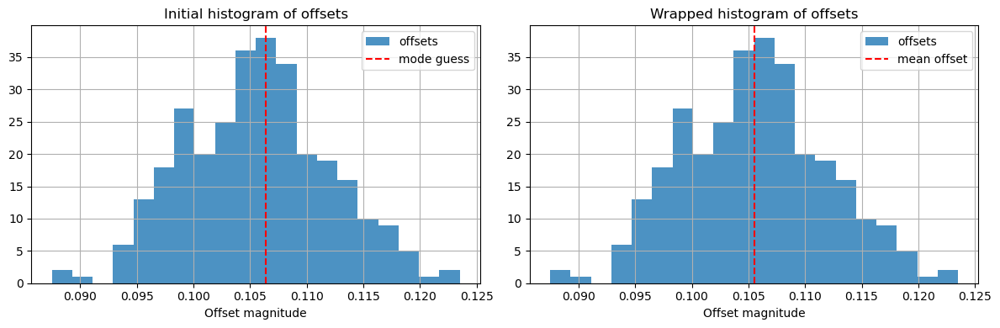



offset = 0.106 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of 0.054 seconds over 12000.0 switches
Corrected Switch Time = 0.2500045


In [161]:
filename = 'Datasets/Whole_setup/11-16/PAX_11-16_CON_Orth_1560_laptop.csv'
ds_1560 = SwitchSet(filename, set_range=(0,0.05), skip_default_signal_baseline=20)
ds_1560.find_switches(nominal_switch_rate=2, print_process=True)

In [162]:
ds_1560.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 0 observations with <4 points (out of total 19300 observations)

--- interpolating data ---
length before: 9650
length after: 9650
0 total added
--- end interpolating data ---

--- interpolating data ---
length before: 9650
length after: 9650
0 total added
--- end interpolating data ---
Signal 1 size=9650	Signal 1 range: t=(20.68,4845.26)
Signal 2 size=9650	Signal 2 range: t=(20.43,4845.01)
=== end average_data ===


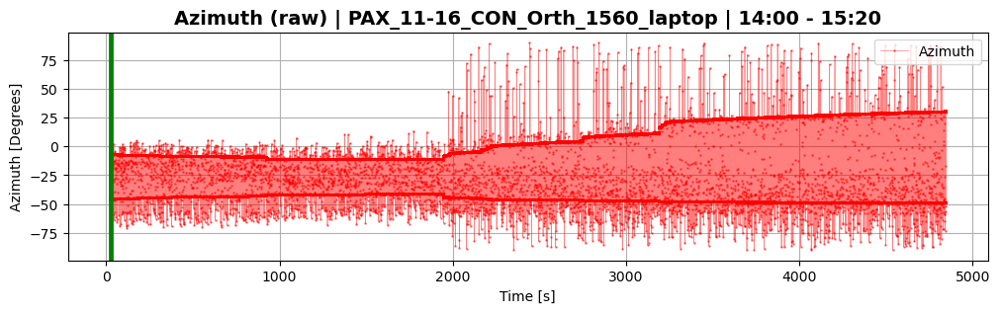

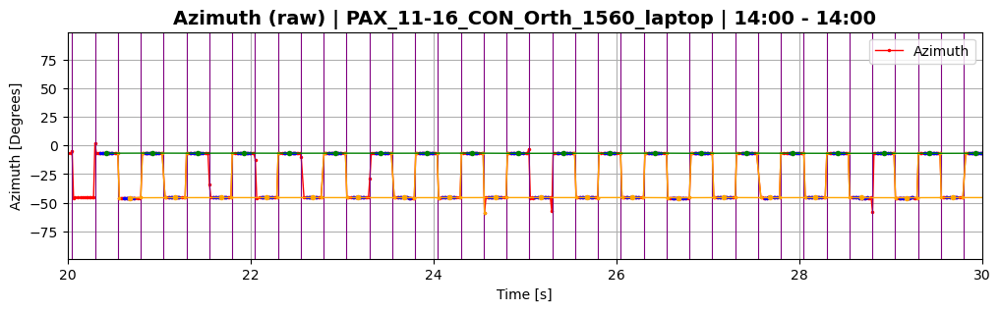

In [163]:
ds_1560.plot_raw(plot_param='Azimuth', sample_range=(20,30),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

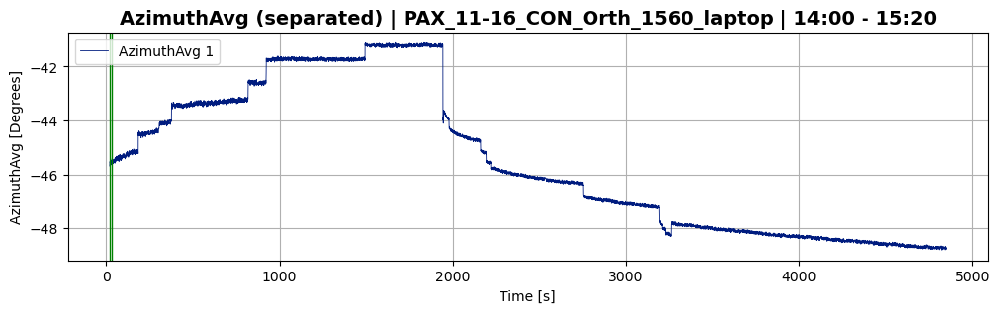

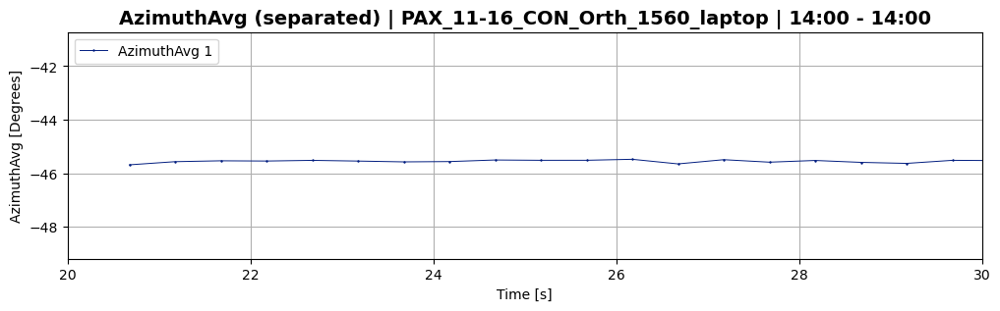

In [164]:
ds_1560.plot_separated(plot_param='AzimuthAvg',plot_signal=1,sample_range=(20,30))

In [165]:
reset_times_1560 = ds_1560.calc_stokes_ptf(reference=reset_times_1345, angle_threshold_deg=2, reset_delay=5, print_process=True);

Using provided reset times to reset reference matrix
Reference matrix was reset 10 times
Reset at time t=719.06
Reset at time t=927.57
Reset at time t=1669.58
Reset at time t=1947.59
Reset at time t=1982.59
Reset at time t=2167.59
Reset at time t=2530.10
Reset at time t=2880.60
Reset at time t=3229.11
Reset at time t=4499.63


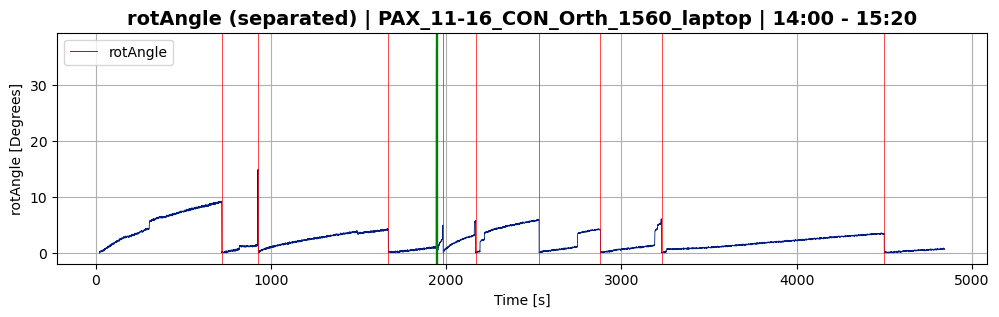

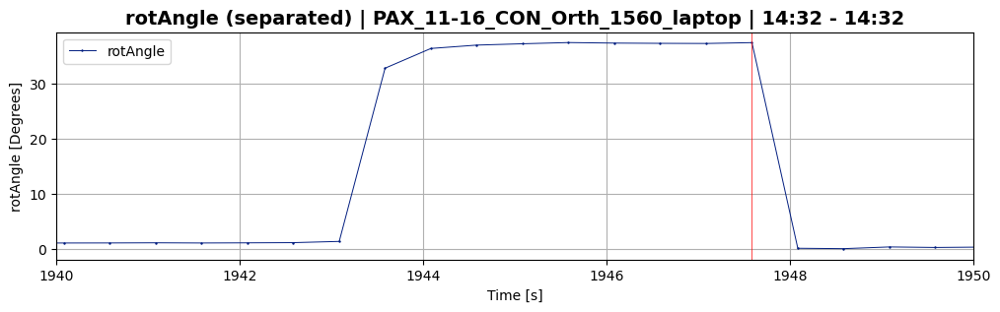

In [170]:
ds_1560.plot_separated(plot_param='rotAngle',sample_range=(1940,1950))

##### Both 1345 and 1560 rotAngle

In [167]:
ds_con_11_16 = (ds_1345, ds_1560)

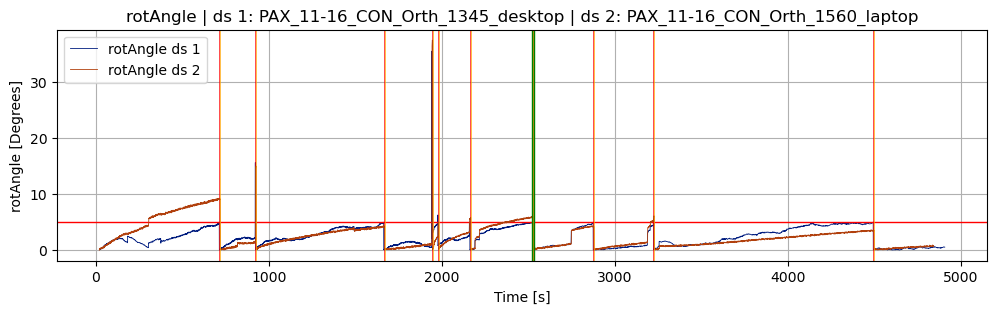

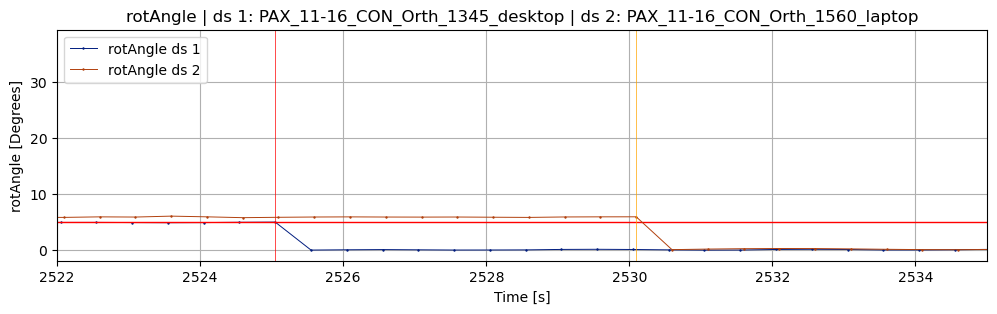

In [172]:
plot_rot_angle(ds_1345, ds_1560, birds_eye=True, sample_range=(2522,2535))

### 50m short dataset 24-3-11

##### 1345 dataset

In [5]:
# filename = DATA + 'Whole_setup/10-30/PAX_10-30_ARL_Orth_1345_desktop.csv'
# ds_test = Dataset(filename,set_range=(0,0.01),skip_default_signal_baseline=False)

Time range: min=0.029, max=955.284


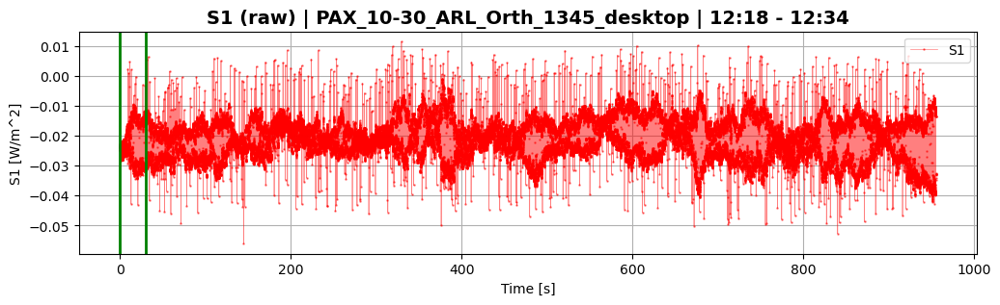

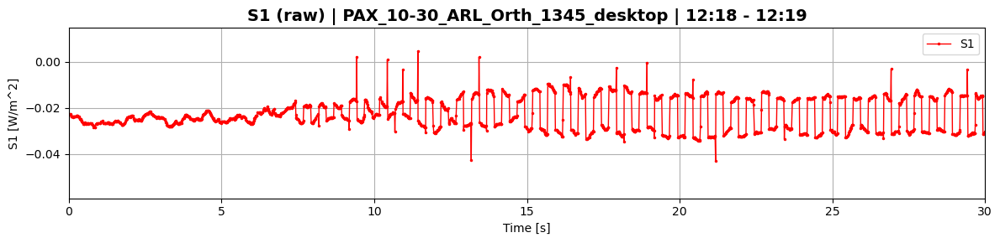

(<Figure size 1200x300 with 1 Axes>, <Figure size 1200x300 with 1 Axes>)

In [10]:
#ds_test.plot_raw(plot_param="S1",sample_range=(0,30))

Time range: min=20.006, max=2324.049
Determining change point ranges automatically...
Using change_point_range_1=(20.006, 120.006)
Using change_point_range_2=(2224.049, 2324.049)
=== performing change point detection ===
cp range: (20.006, 120.006)
using 5390 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5390,)
computing range... ---> range = (0.12,0.18)
displaying jump_fig for switch parameter = s1



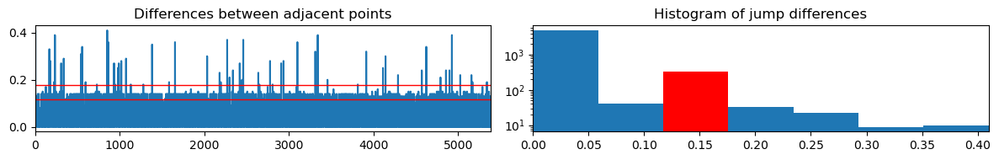



found width of 0.059 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5390,)
computing range... ---> range = (1.23,1.29)
displaying jump_fig for switch parameter = s2



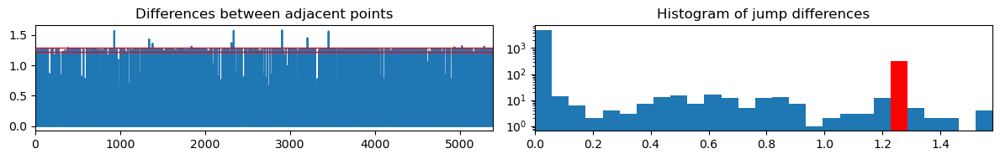



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5390,)
computing range... ---> range = (0.45,0.50)
displaying jump_fig for switch parameter = s3



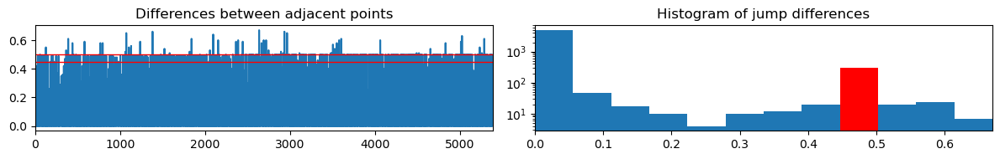



--- end of switch param: s3 ---

---> switch parameter found: s1 <---
finding differences within range = (0.12,0.18)
Jump points detected: 334
out of total: ~399.9

computing offset...


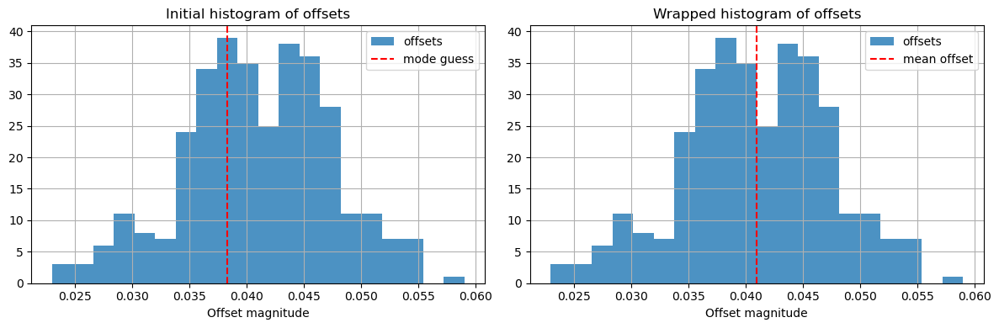



offset = 0.041 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (2224.049, 2324.049)
using 5189 data entries
skipping 115930 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5189,)
computing range... ---> range = (0.08,0.14)
displaying jump_fig for switch parameter = s1



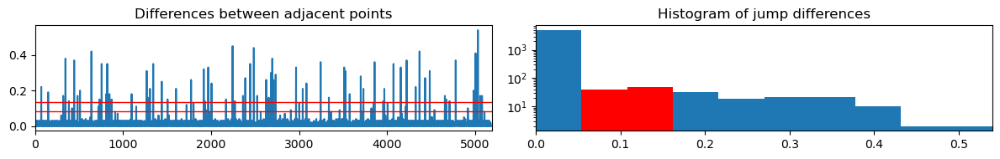



found width of 0.054 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5189,)
computing range... ---> range = (1.01,1.07)
displaying jump_fig for switch parameter = s2



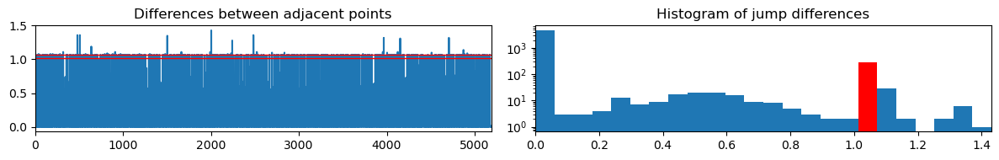



found width of 0.060 for s2
greater than prev width of 0.054 for s1
--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5189,)
computing range... ---> range = (0.81,0.87)
displaying jump_fig for switch parameter = s3



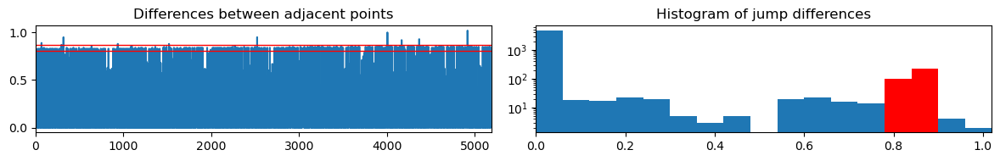



found width of 0.060 for s3
greater than prev width of 0.060 for s2
--- end of switch param: s3 ---

---> switch parameter found: s3 <---
finding differences within range = (0.81,0.87)
Jump points detected: 302
out of total: ~400.0

computing offset...


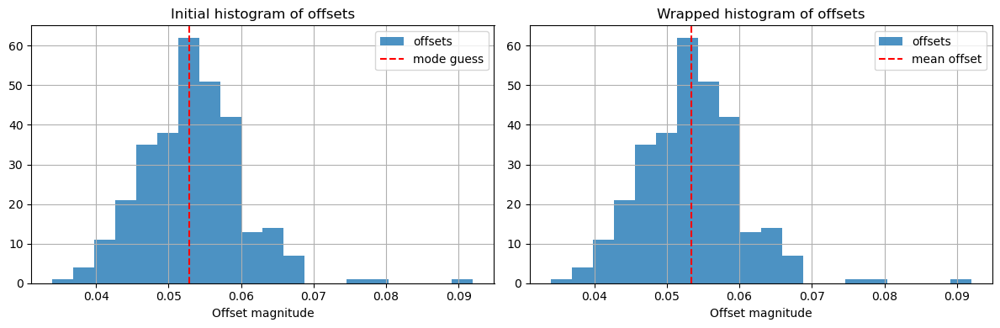



offset = 0.053 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of 0.012 seconds over 8816.172 switches
Corrected Switch Time = 0.2500014


In [53]:
filename = 'Datasets/Whole_setup/03-11/PAX_3-11_50m_Orth_2_1345_desktop.csv'
ds_1345 = SwitchSet(filename, set_range=None, skip_default_signal_baseline=20)
ds_1345.find_switches(nominal_switch_rate=2, print_process=True)

In [54]:
ds_1345.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 35 observations with <4 points (out of total 9213 observations)

--- interpolating data ---
length before: 4590
length after: 4607
17 total added
--- end interpolating data ---

--- interpolating data ---
length before: 4588
length after: 4607
19 total added
--- end interpolating data ---
Signal 1 size=4607	Signal 1 range: t=(20.42,2323.43)
Signal 2 size=4607	Signal 2 range: t=(20.67,2323.68)
=== end average_data ===


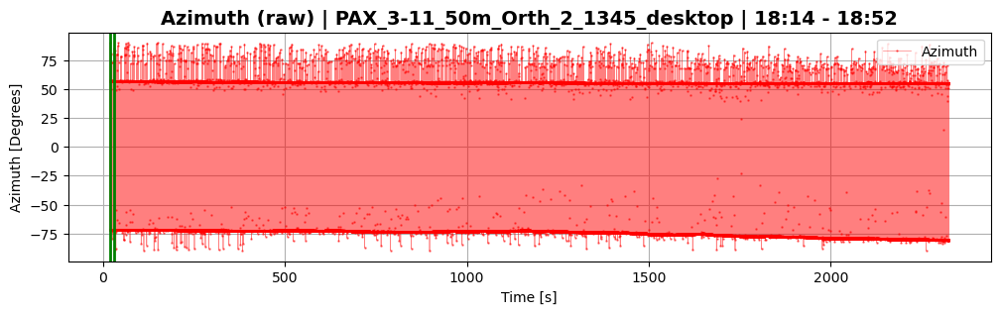

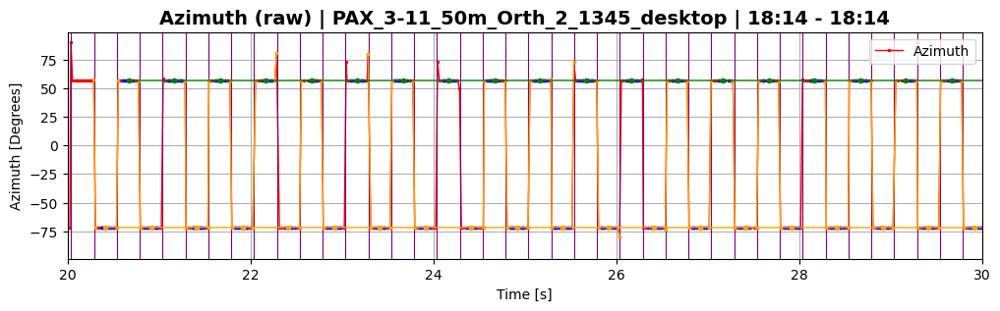

In [55]:
ds_1345.plot_raw(plot_param='Azimuth', sample_range=(20,30),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

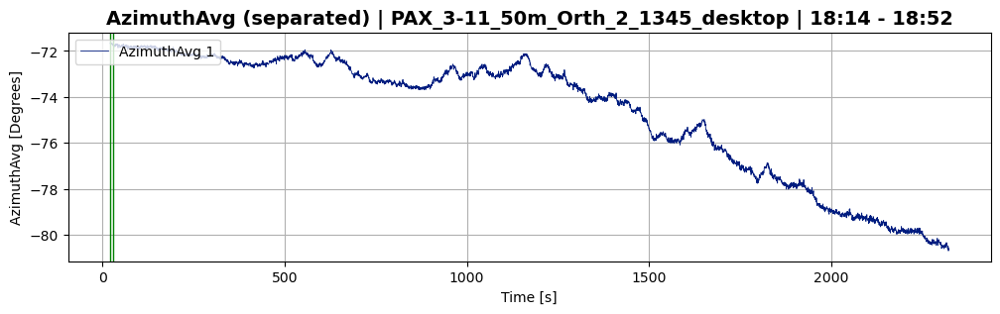

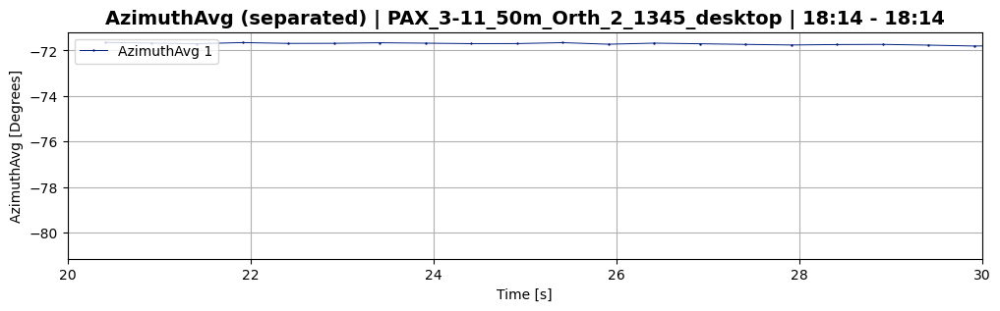

In [56]:
ds_1345.plot_separated(plot_param='AzimuthAvg',plot_signal=1,sample_range=(20,30))

In [79]:
reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=2, print_process=True);

Using "resetting reference SOPs" approach with threshold = 2.0 degrees
Reference matrix was reset 12 times
Reset at time t=211.04
Reset at time t=430.54
Reset at time t=500.54
Reset at time t=711.04
Reset at time t=896.55
Reset at time t=1038.55
Reset at time t=1303.05
Reset at time t=1497.05
Reset at time t=1746.05
Reset at time t=1949.05
...


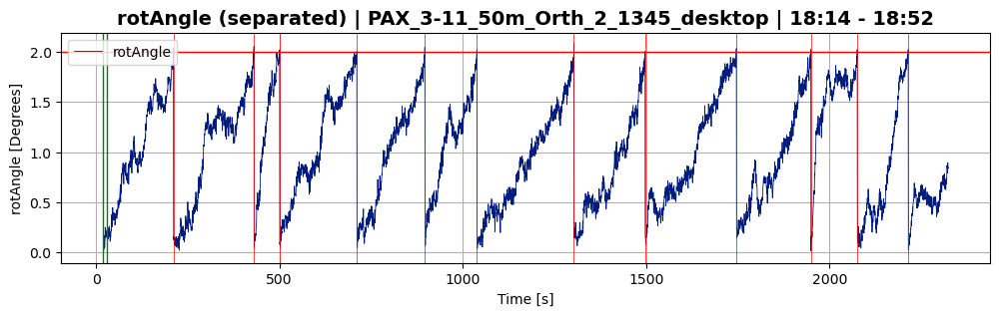

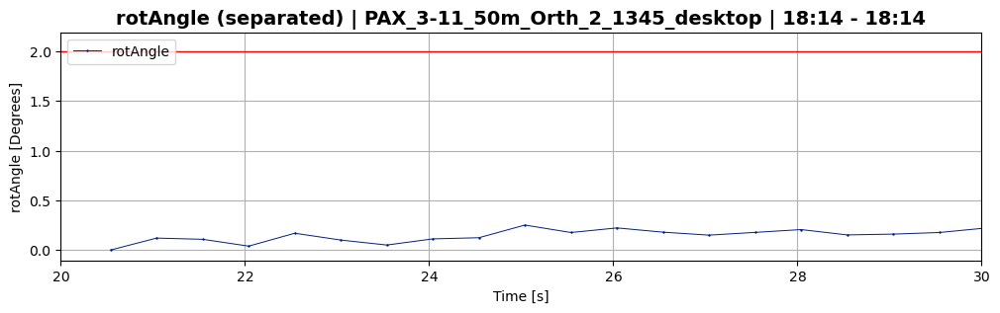

In [80]:
ds_1345.plot_separated(plot_param='rotAngle',sample_range=(20,30))

##### 1560 dataset

Time range: min=20.003, max=2324.011
Determining change point ranges automatically...
Using change_point_range_1=(20.003, 120.003)
Using change_point_range_2=(2224.011, 2324.011)
=== performing change point detection ===
cp range: (20.003, 120.003)
using 5952 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5952,)
computing range... ---> range = (0.29,0.35)
displaying jump_fig for switch parameter = s1



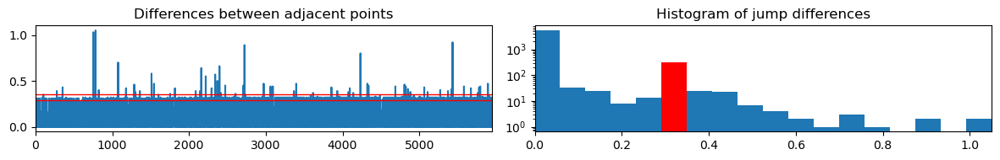



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5952,)
computing range... ---> range = (1.17,1.23)
displaying jump_fig for switch parameter = s2



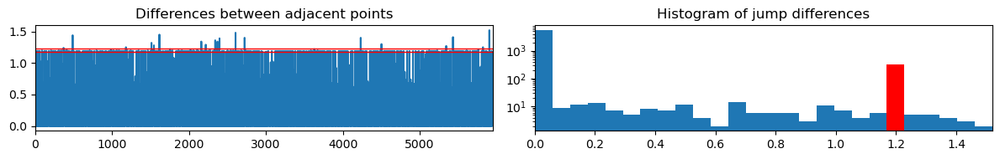



found width of 0.058 for s2
greater than prev width of 0.058 for s1
--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5952,)
computing range... ---> range = (0.66,0.72)
displaying jump_fig for switch parameter = s3



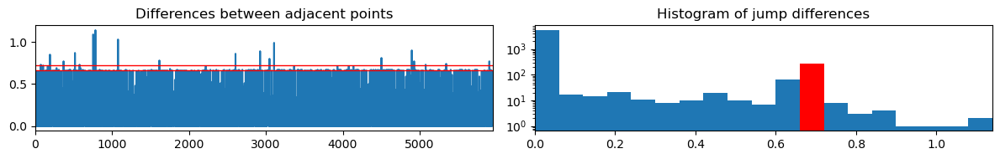



found width of 0.060 for s3
greater than prev width of 0.058 for s2
--- end of switch param: s3 ---

---> switch parameter found: s3 <---
finding differences within range = (0.66,0.72)
Jump points detected: 270
out of total: ~399.9

computing offset...


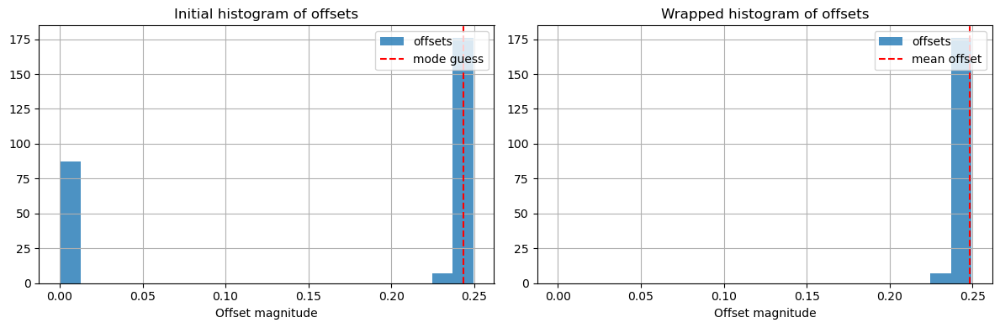



offset = 0.248 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (2224.011, 2324.011)
using 5867 data entries
skipping 130601 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5867,)
computing range... ---> range = (0.52,0.58)
displaying jump_fig for switch parameter = s1



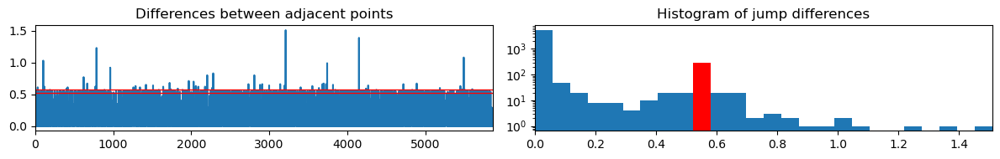



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5867,)
computing range... ---> range = (0.94,1.00)
displaying jump_fig for switch parameter = s2



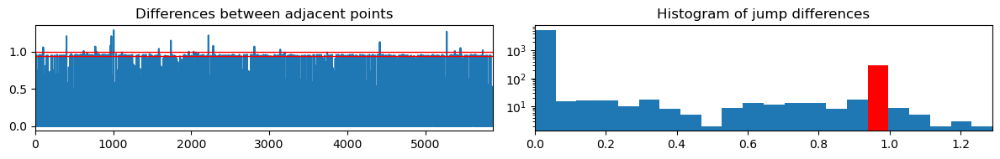



found width of 0.059 for s2
greater than prev width of 0.058 for s1
--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5867,)
computing range... ---> range = (0.83,0.89)
displaying jump_fig for switch parameter = s3



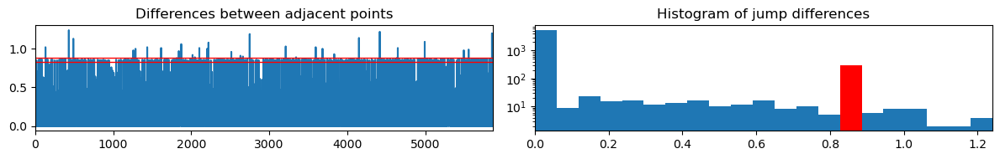



found width of 0.059 for s3
greater than prev width of 0.059 for s2
--- end of switch param: s3 ---

---> switch parameter found: s3 <---
finding differences within range = (0.83,0.89)
Jump points detected: 297
out of total: ~400.0

computing offset...


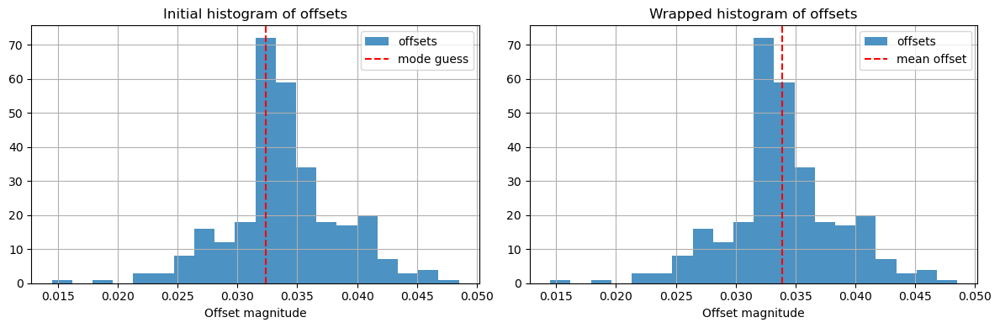



offset = 0.034 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of 0.036 seconds over 8816.032 switches
Corrected Switch Time = 0.2500040


In [59]:
filename = 'Datasets/Whole_setup/03-11/PAX_3-11_50m_Orth_2_1560_laptop.csv'
ds_1560 = SwitchSet(filename, set_range=None, skip_default_signal_baseline=20)
ds_1560.find_switches(nominal_switch_rate=2, print_process=True)

In [60]:
ds_1560.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 0 observations with <4 points (out of total 9214 observations)

--- interpolating data ---
length before: 4607
length after: 4607
0 total added
--- end interpolating data ---

--- interpolating data ---
length before: 4607
length after: 4607
0 total added
--- end interpolating data ---
Signal 1 size=4607	Signal 1 range: t=(20.62,2323.66)
Signal 2 size=4607	Signal 2 range: t=(20.37,2323.41)
=== end average_data ===


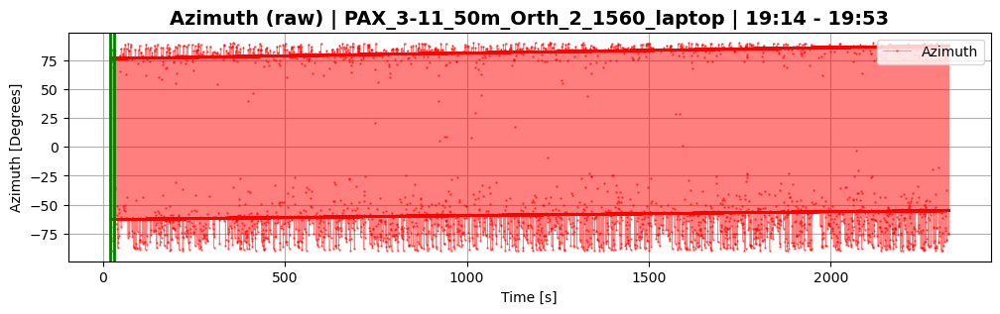

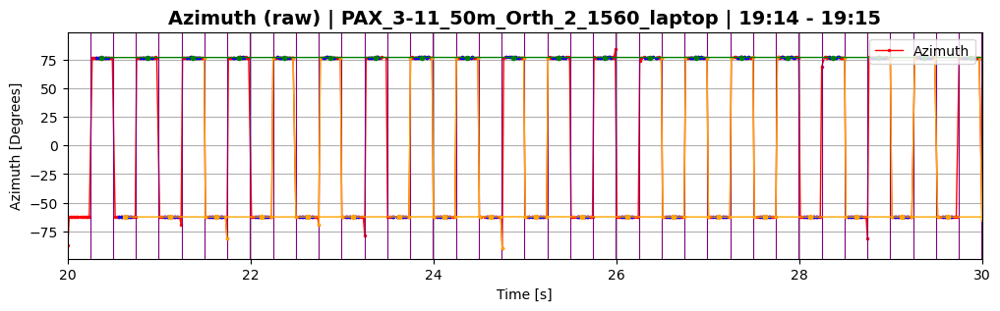

In [61]:
ds_1560.plot_raw(plot_param='Azimuth', sample_range=(20,30),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

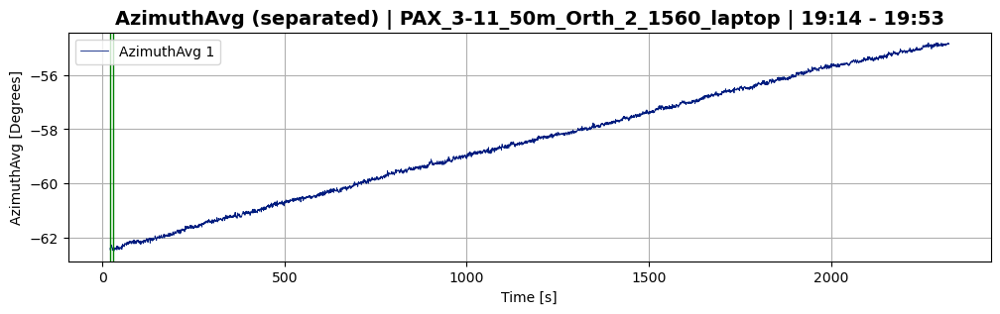

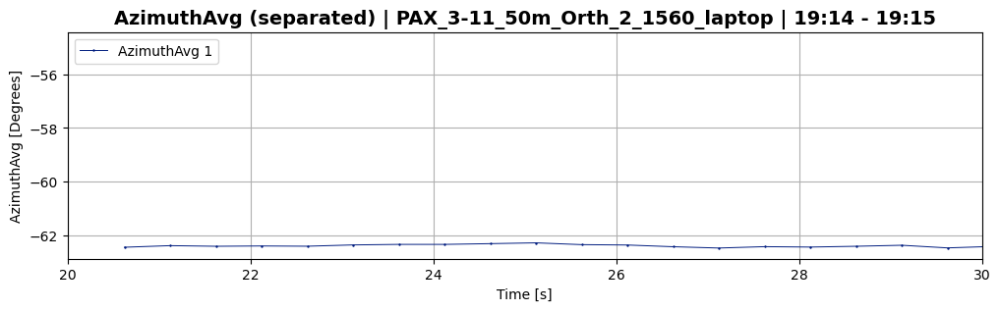

In [62]:
ds_1560.plot_separated(plot_param='AzimuthAvg',plot_signal=1,sample_range=(20,30))

In [81]:
reset_times_1560 = ds_1560.calc_stokes_ptf(reference=reset_times_1345, reset_delay=0, print_process=True);

Using provided reset times to reset reference matrix
Reference matrix was reset 12 times
Reset at time t=211.50
Reset at time t=431.00
Reset at time t=501.01
Reset at time t=711.51
Reset at time t=897.01
Reset at time t=1039.01
Reset at time t=1303.52
Reset at time t=1497.52
Reset at time t=1746.53
Reset at time t=1949.53
...


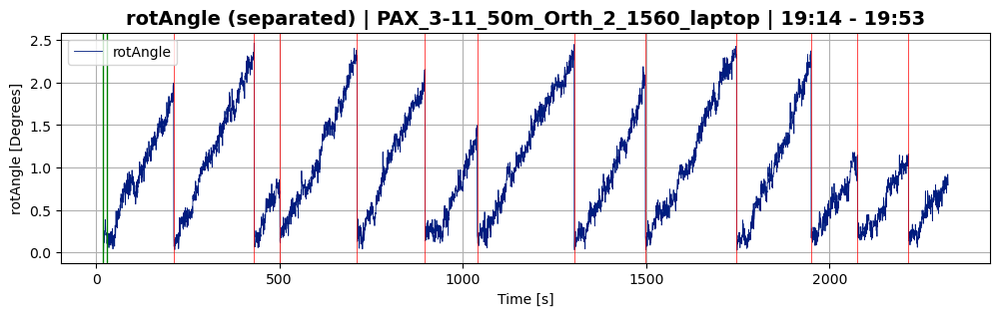

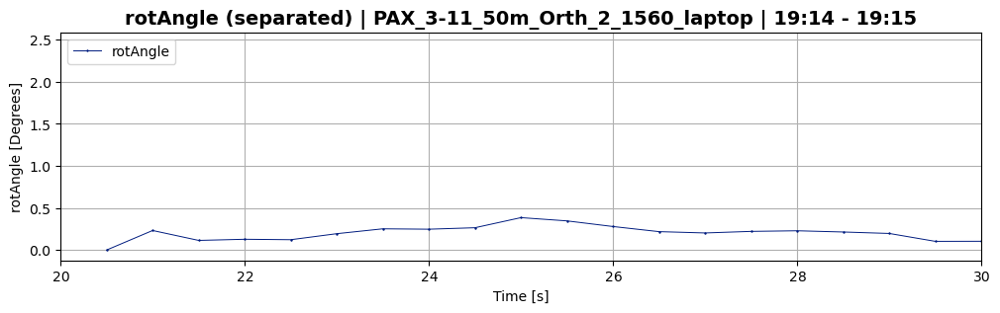

In [82]:
ds_1560.plot_separated(plot_param='rotAngle',sample_range=(20,30))

##### Both 1345 and 1560 rotAngle

In [83]:
ds_50m_3_11 = (ds_1345, ds_1560)

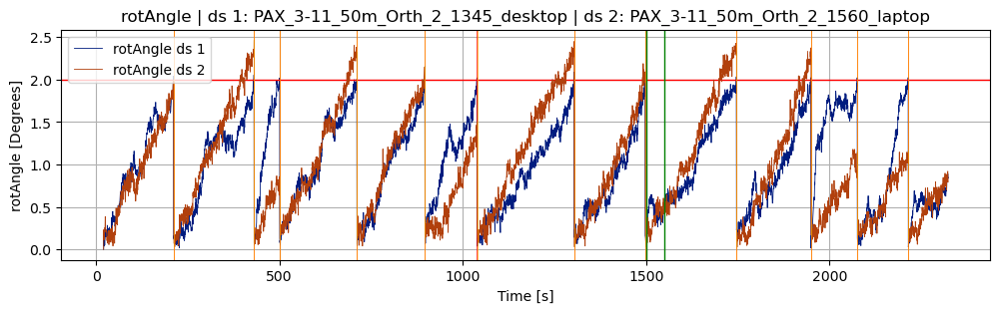

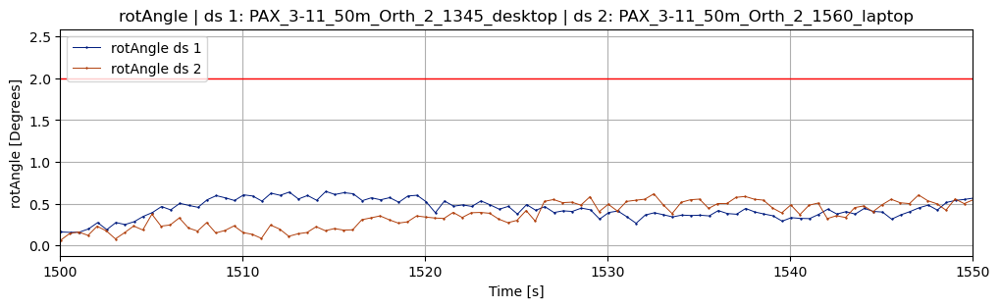

In [84]:
plot_rot_angle(ds_50m_3_11[0], ds_50m_3_11[1], birds_eye=True, sample_range=(1500,1550))

In [86]:
statistics.mean(reset_times_1560)

1214.9333957367376

### ARL dataset 23-08-17

##### 1345 dataset

In [45]:
plt.ioff()
plt.close('all')

Time range: min=20.005, max=922.238


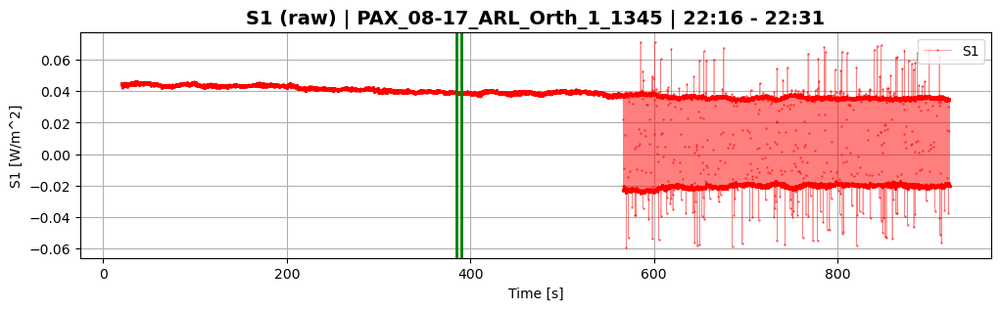

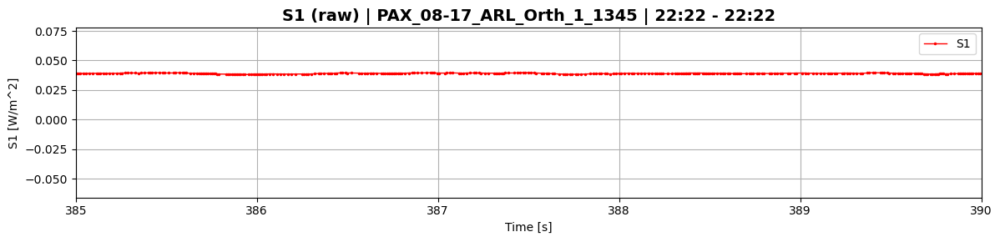

(<Figure size 1200x300 with 1 Axes>, <Figure size 1200x300 with 1 Axes>)

In [48]:
# filename = 'Datasets/Whole_setup/08-17/PAX_08-17_ARL_Orth_1_1345.csv'
# ds_test = Dataset(filename,set_range=(0,0.02))
# ds_test.plot_raw(plot_param="S1",sample_range=(565,575))

Time range: min=570.005, max=6617.293
Determining change point ranges automatically...
Using change_point_range_1=(570.005, 670.005)
Using change_point_range_2=(3570.005, 3670.005)
=== performing change point detection ===
cp range: (570.005, 670.005)
using 6415 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (6415,)
computing range... ---> range = (0.91,0.96)
displaying jump_fig for switch parameter = s1



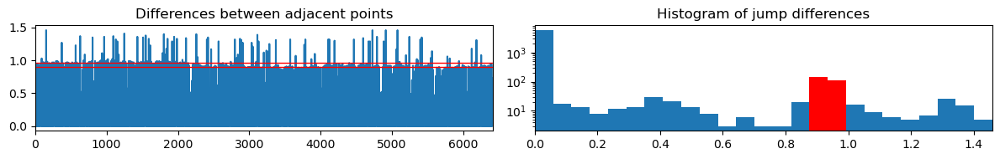



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (6415,)
computing range... ---> range = (0.09,0.14)
displaying jump_fig for switch parameter = s2



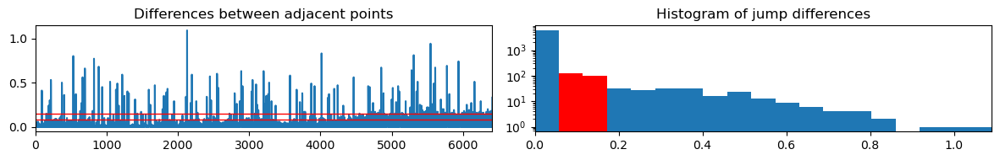



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (6415,)
computing range... ---> range = (1.68,1.74)
displaying jump_fig for switch parameter = s3



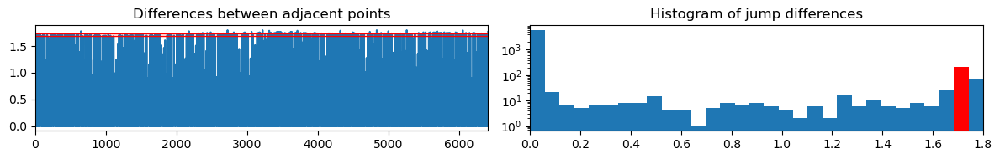



--- end of switch param: s3 ---

---> switch parameter found: s1 <---
finding differences within range = (0.91,0.96)
Jump points detected: 137
out of total: ~400.0

computing offset...


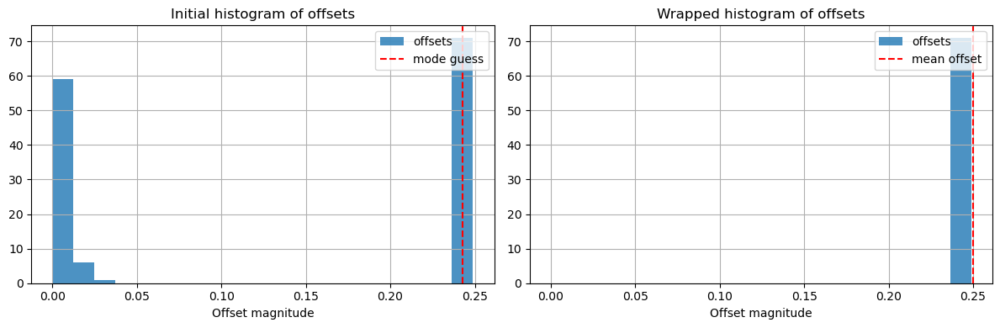



offset = 0.250 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (3570.005, 3670.005)
using 6728 data entries
skipping 201483 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (6728,)
computing range... ---> range = (0.32,0.38)
displaying jump_fig for switch parameter = s1



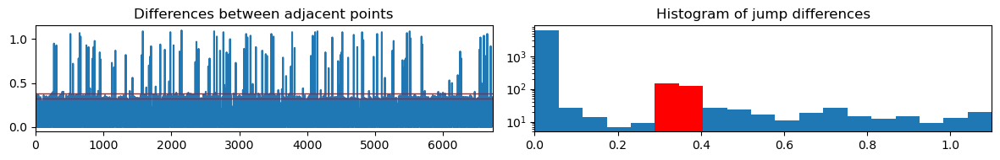



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (6728,)
computing range... ---> range = (0.06,0.12)
displaying jump_fig for switch parameter = s2



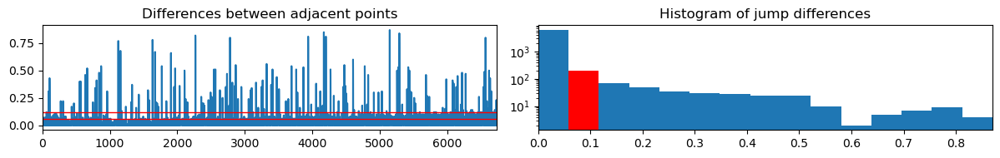



found width of 0.058 for s2
greater than prev width of 0.058 for s1
--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (6728,)
computing range... ---> range = (1.89,1.95)
displaying jump_fig for switch parameter = s3



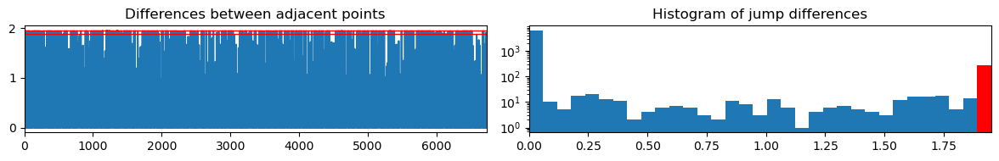



found width of 0.059 for s3
greater than prev width of 0.058 for s2
--- end of switch param: s3 ---

---> switch parameter found: s3 <---
finding differences within range = (1.89,1.95)
Jump points detected: 267
out of total: ~400.0

computing offset...


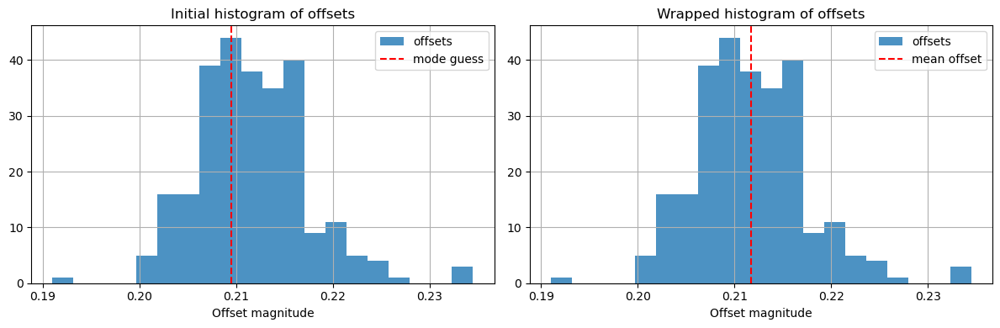



offset = 0.212 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of -0.038 seconds over 12000.0 switches
Corrected Switch Time = 0.2499968


In [111]:
filename = 'Datasets/Whole_setup/08-17/PAX_08-17_ARL_Orth_1_1345.csv'
#ds = SwitchSet(filename, skip_default_signal_baseline=14)
#ds.find_switches(nominal_switch_rate=2, change_point_range_1=(15,50), print_process=True)
ds_1345 = SwitchSet(filename, set_range=(0,0.15), skip_default_signal_baseline=570)
ds_1345.find_switches(nominal_switch_rate=2, print_process=True)

In [112]:
ds_1345.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 15 observations with <4 points (out of total 24050 observations)

--- interpolating data ---
length before: 12021
length after: 12094
73 total added
--- end interpolating data ---

--- interpolating data ---
length before: 12014
length after: 12094
80 total added
--- end interpolating data ---
Signal 1 size=12094	Signal 1 range: t=(570.38,6616.80)
Signal 2 size=12094	Signal 2 range: t=(570.63,6617.05)
=== end average_data ===


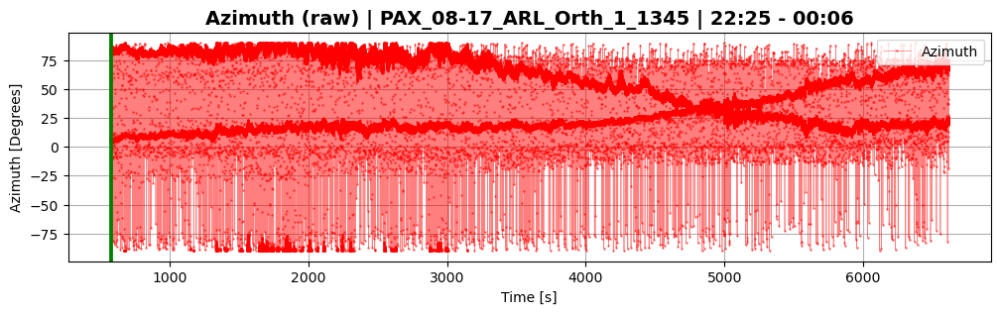

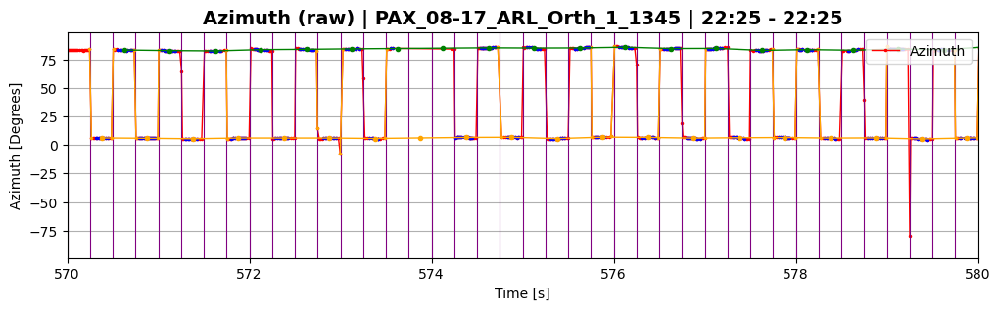

In [113]:
ds_1345.plot_raw(plot_param='Azimuth', sample_range=(570,580),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

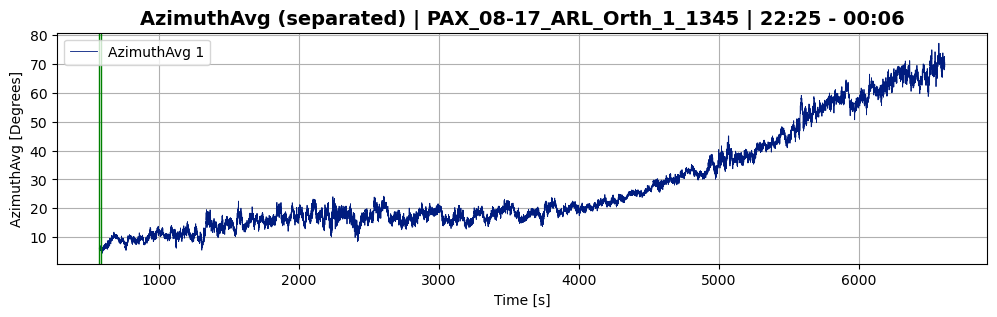

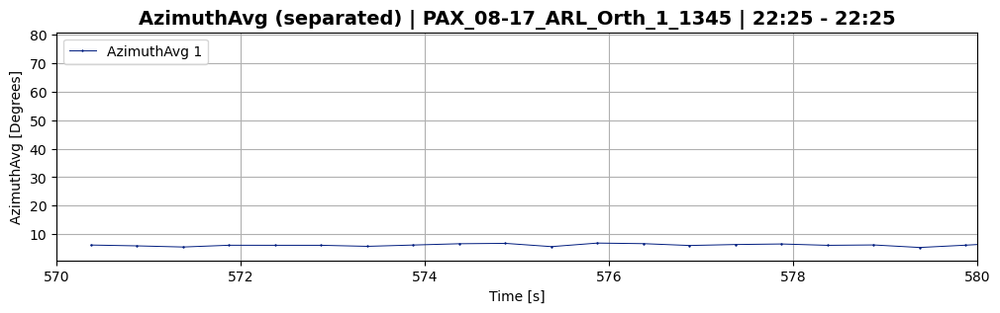

In [114]:
ds_1345.plot_separated(plot_param='AzimuthAvg',plot_signal=1,sample_range=(570,580))

In [115]:
reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=12, print_process=True);

Using "resetting reference SOPs" approach with threshold = 12.0 degrees
Reference matrix was reset 34 times
Reset at time t=855.50
Reset at time t=1149.49
Reset at time t=1154.99
Reset at time t=1166.49
Reset at time t=1177.99
Reset at time t=1362.99
Reset at time t=1370.49
Reset at time t=1724.49
Reset at time t=1752.49
Reset at time t=1867.48
...


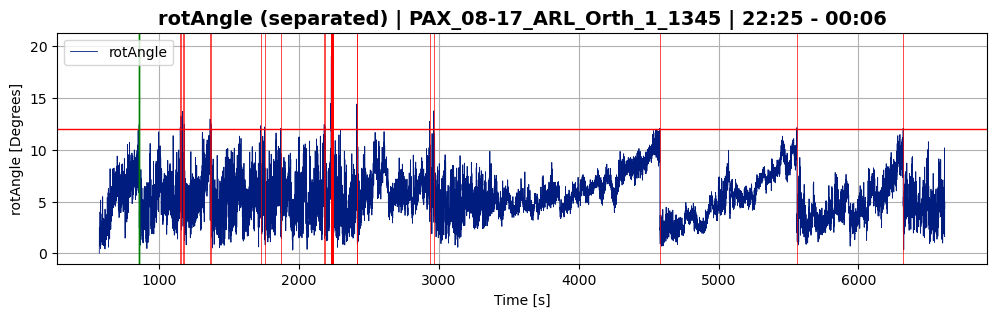

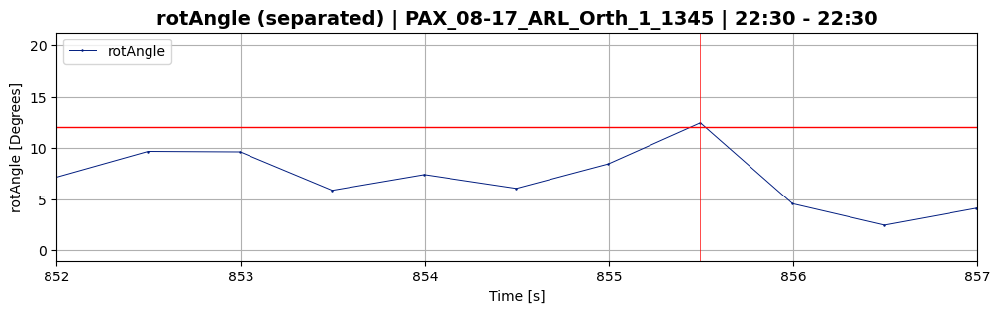

In [116]:
ds_1345.plot_separated(plot_param='rotAngle',plot_signal=1,sample_range=(852,857))

##### 1560 dataset

Time range: min=570.005, max=6618.248
Determining change point ranges automatically...
Using change_point_range_1=(570.005, 670.005)
Using change_point_range_2=(3570.005, 3670.005)
=== performing change point detection ===
cp range: (570.005, 670.005)
using 5658 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5658,)
computing range... ---> range = (1.52,1.58)
displaying jump_fig for switch parameter = s1



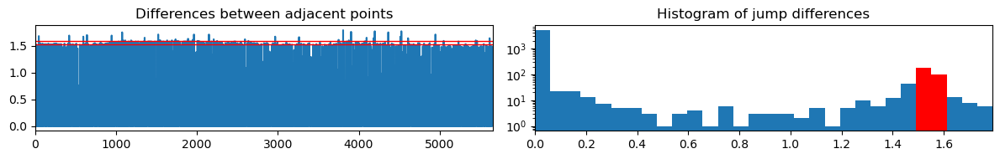



found width of 0.060 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5658,)
computing range... ---> range = (1.08,1.14)
displaying jump_fig for switch parameter = s2



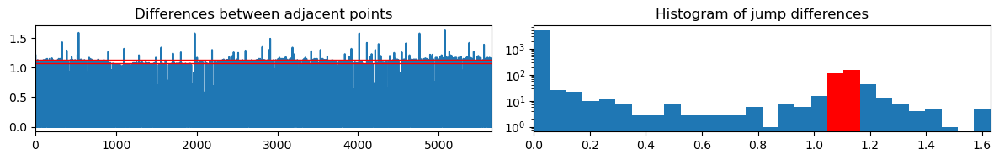



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5658,)
computing range... ---> range = (0.58,0.64)
displaying jump_fig for switch parameter = s3



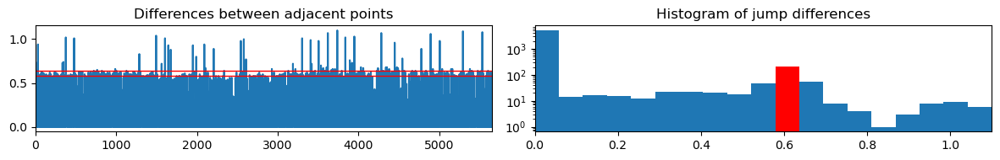



--- end of switch param: s3 ---

---> switch parameter found: s1 <---
finding differences within range = (1.52,1.58)
Jump points detected: 183
out of total: ~399.9

computing offset...


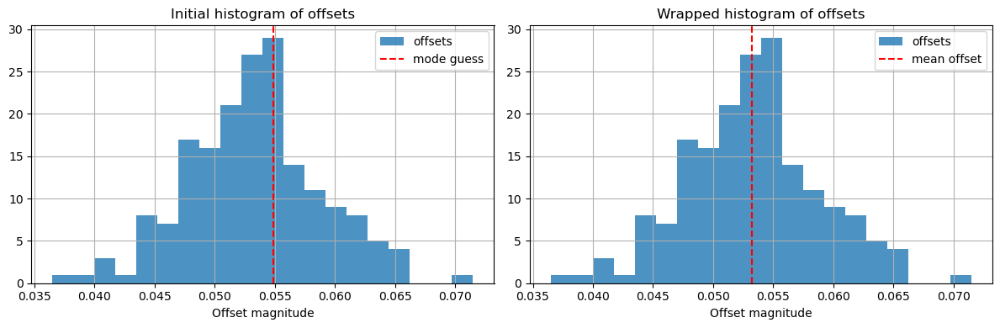



offset = 0.053 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (3570.005, 3670.005)
using 5734 data entries
skipping 171203 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5734,)
computing range... ---> range = (1.13,1.19)
displaying jump_fig for switch parameter = s1



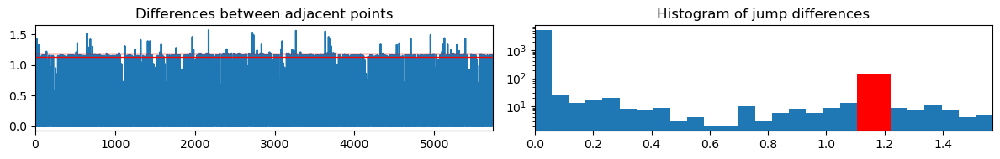



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5734,)
computing range... ---> range = (1.42,1.48)
displaying jump_fig for switch parameter = s2



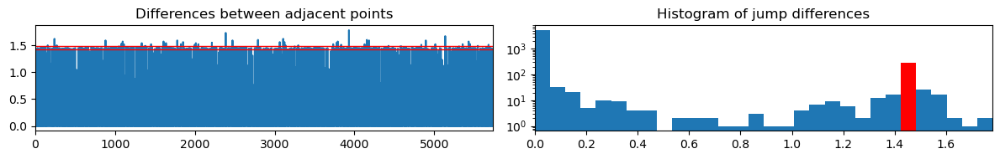



found width of 0.059 for s2
greater than prev width of 0.058 for s1
--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5734,)
computing range... ---> range = (0.67,0.73)
displaying jump_fig for switch parameter = s3



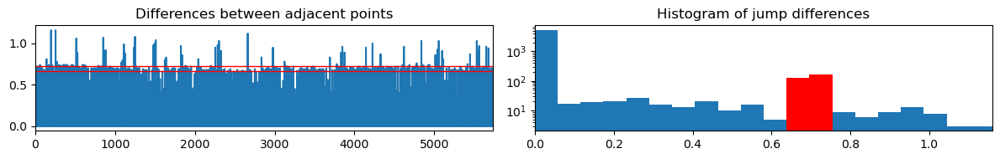



--- end of switch param: s3 ---

---> switch parameter found: s2 <---
finding differences within range = (1.42,1.48)
Jump points detected: 290
out of total: ~400.0

computing offset...


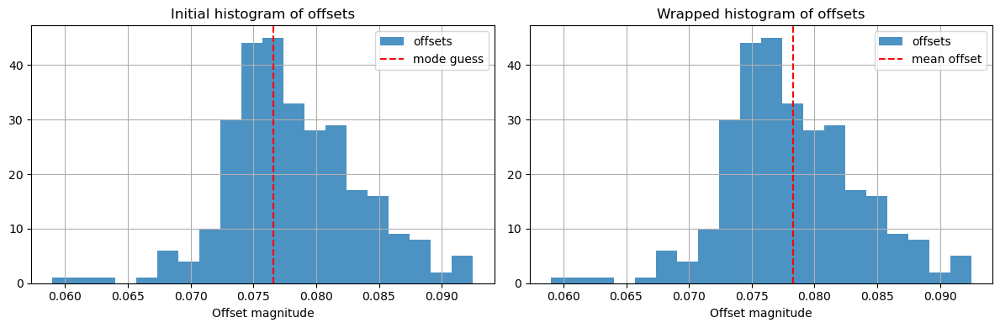



offset = 0.078 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of 0.025 seconds over 12000.0 switches
Corrected Switch Time = 0.2500021


In [130]:
filename = 'Datasets/Whole_setup/08-17/PAX_08-17_ARL_Orth_1_1560.csv'
#ds = SwitchSet(filename, skip_default_signal_baseline=14)
#ds.find_switches(nominal_switch_rate=2, change_point_range_1=(15,50), print_process=True)
ds_1560 = SwitchSet(filename, set_range=(0,0.15), skip_default_signal_baseline=570)
ds_1560.find_switches(nominal_switch_rate=2, print_process=True)

In [131]:
ds_1560.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 0 observations with <4 points (out of total 24192 observations)

--- interpolating data ---
length before: 12096
length after: 12096
0 total added
--- end interpolating data ---

--- interpolating data ---
length before: 12096
length after: 12096
0 total added
--- end interpolating data ---
Signal 1 size=12096	Signal 1 range: t=(570.18,6617.73)
Signal 2 size=12096	Signal 2 range: t=(570.43,6617.98)
=== end average_data ===


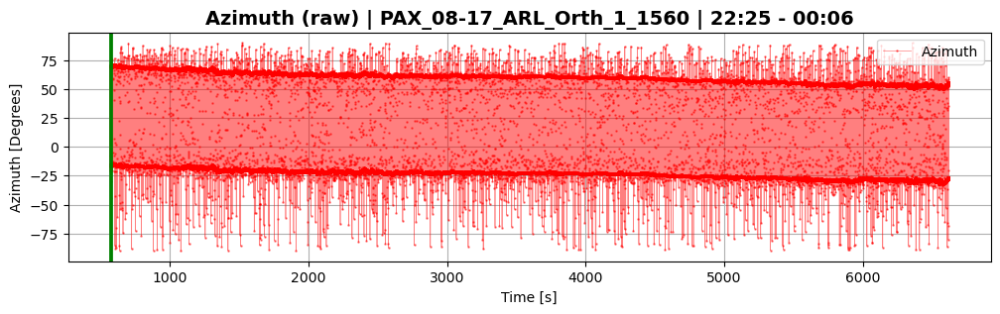

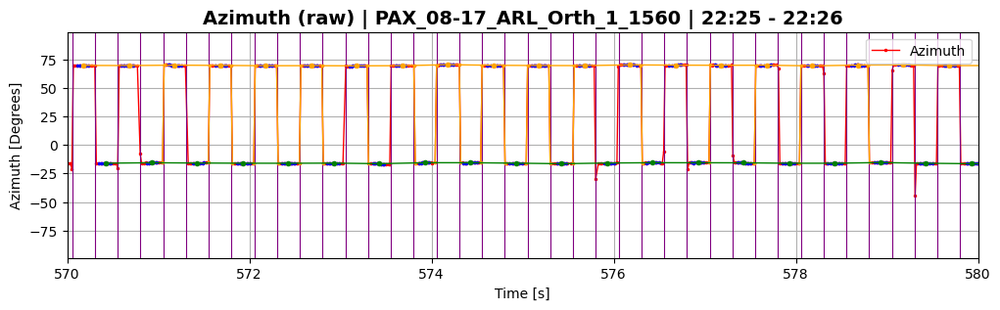

In [132]:
ds_1560.plot_raw(plot_param='Azimuth', sample_range=(570,580),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

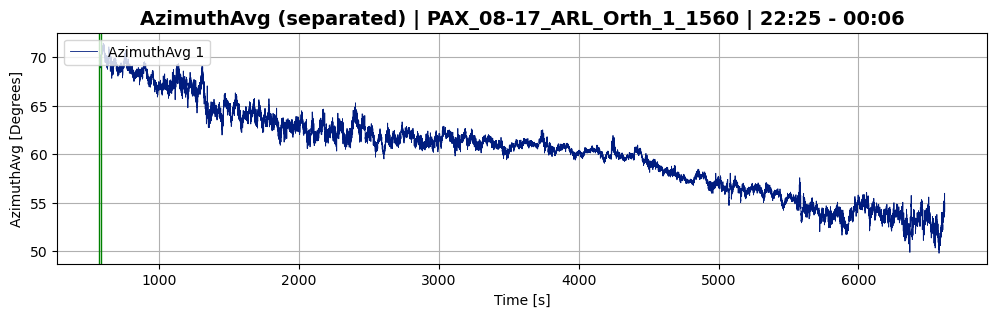

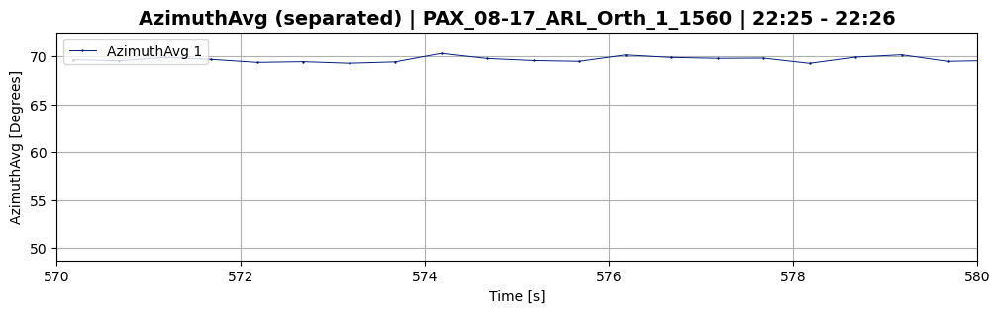

In [133]:
ds_1560.plot_separated(plot_param='AzimuthAvg',plot_signal=1,sample_range=(570,580))

In [134]:
reset_times_1560 = ds_1560.calc_stokes_ptf(reference=reset_times_1345, angle_threshold_deg=2, print_process=True);

Using provided reset times to reset reference matrix
Reference matrix was reset 34 times
Reset at time t=855.81
Reset at time t=1149.81
Reset at time t=1155.31
Reset at time t=1166.81
Reset at time t=1178.31
Reset at time t=1363.31
Reset at time t=1370.81
Reset at time t=1724.81
Reset at time t=1752.81
Reset at time t=1867.81
...


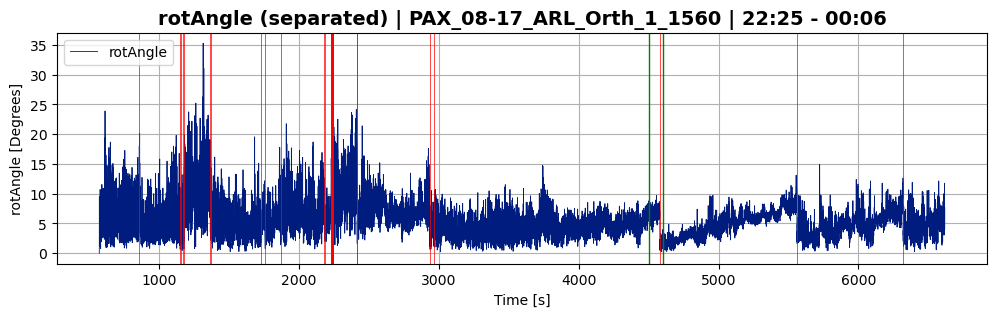

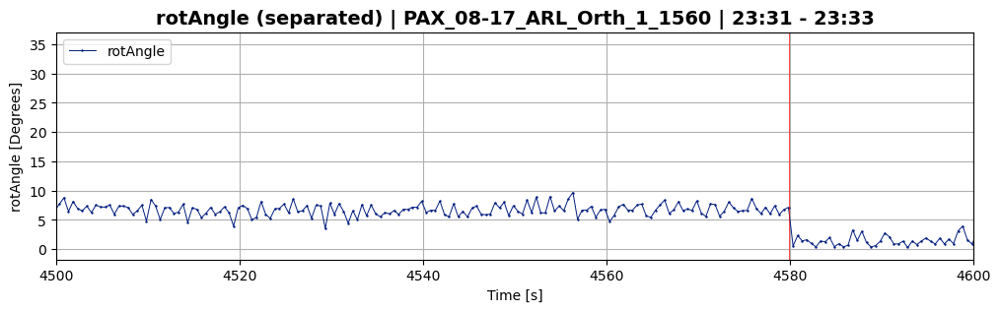

In [138]:
ds_1560.plot_separated(plot_param='rotAngle',plot_signal=1,sample_range=(4500,4600))

##### Both 1345 and 1560 rotAngle

In [136]:
ds_arl_08_17 = (ds_1345, ds_1560)

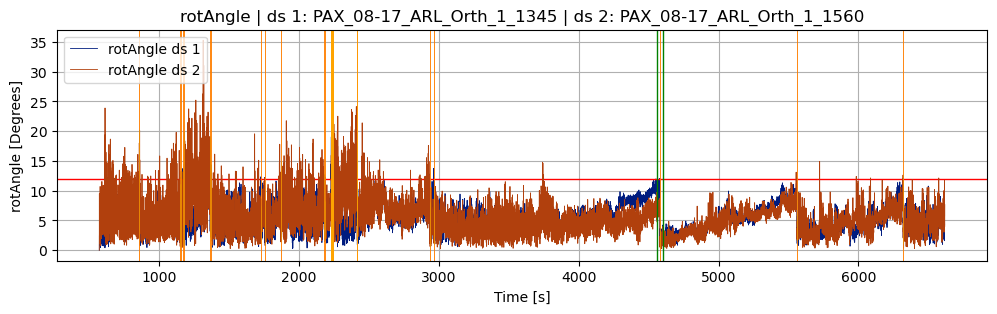

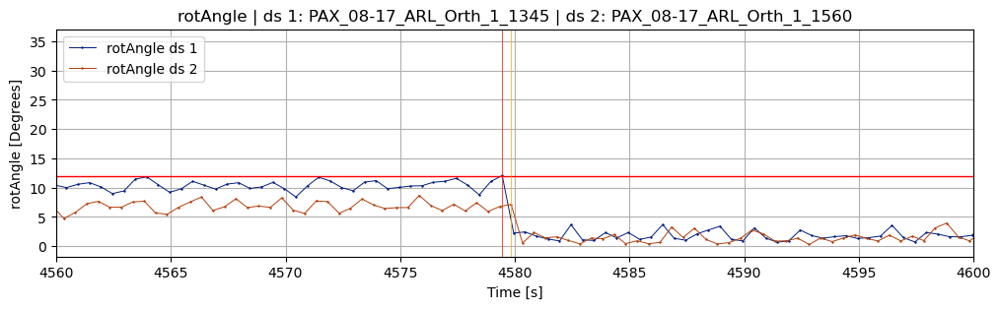

In [140]:
plot_rot_angle(ds_1345, ds_1560, birds_eye=True, sample_range=(4560,4600))

### ARL dataset 23-10-30

##### 1345 dataset

In [11]:
plt.ioff()
plt.close('all')

In [6]:
filename = DATA + 'Whole_setup/10-30/PAX_10-30_ARL_Orth_1345_desktop.csv'
ds_test = Dataset(filename,set_range=(0,0.01),skip_default_signal_baseline=False)

Time range: min=0.029, max=955.284


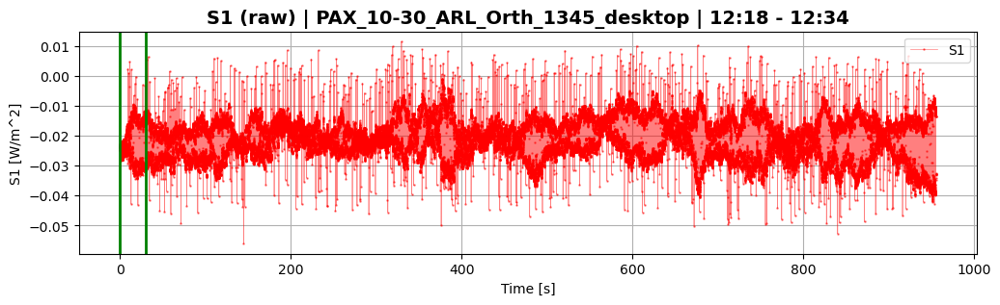

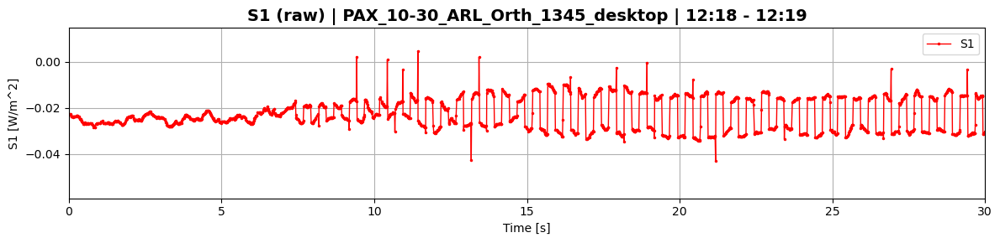

(<Figure size 1200x300 with 1 Axes>, <Figure size 1200x300 with 1 Axes>)

In [10]:
#ds_test.plot_raw(plot_param="S1",sample_range=(0,30))

Time range: min=20.0, max=3836.263
Determining change point ranges automatically...
Using change_point_range_1=(20.0, 120.0)
Using change_point_range_2=(3020.0, 3120.0)
=== performing change point detection ===
cp range: (20.0, 120.0)
using 7736 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (7736,)
computing range... ---> range = (0.15,0.20)
displaying jump_fig for switch parameter = s1



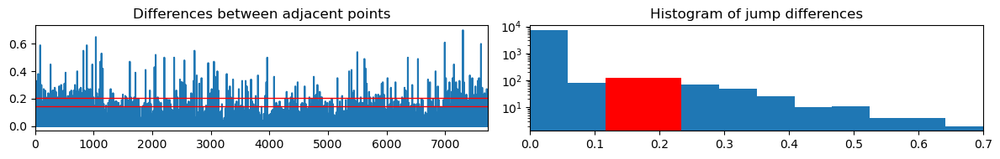



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (7736,)
computing range... ---> range = (0.06,0.11)
displaying jump_fig for switch parameter = s2



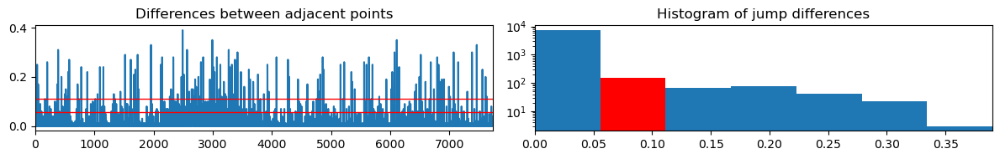



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (7736,)
computing range... ---> range = (1.31,1.37)
displaying jump_fig for switch parameter = s3



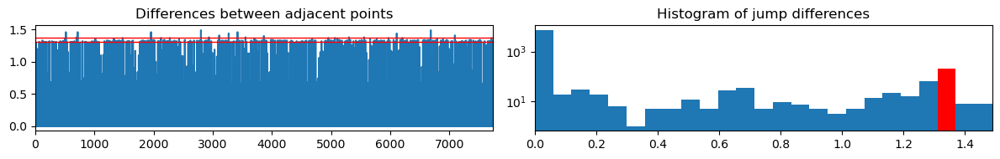



found width of 0.060 for s3
greater than prev width of 0.058 for s1
--- end of switch param: s3 ---

---> switch parameter found: s3 <---
finding differences within range = (1.31,1.37)
Jump points detected: 207
out of total: ~400.0

computing offset...


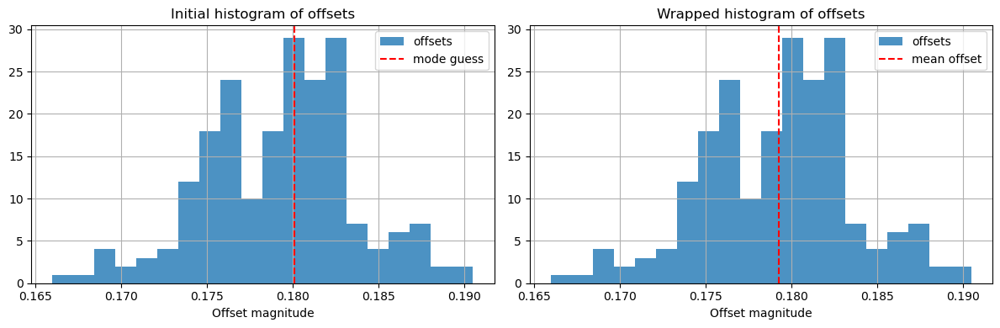



offset = 0.179 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (3020.0, 3120.0)
using 7707 data entries
skipping 232326 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (7707,)
computing range... ---> range = (0.77,0.83)
displaying jump_fig for switch parameter = s1



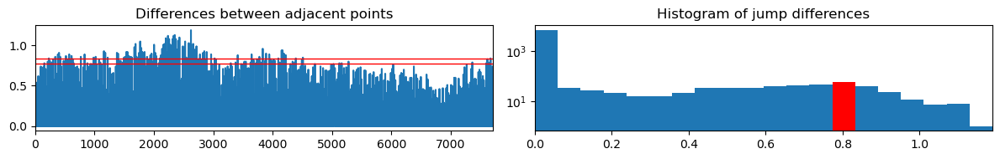



found width of 0.059 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (7707,)
computing range... ---> range = (1.14,1.19)
displaying jump_fig for switch parameter = s2



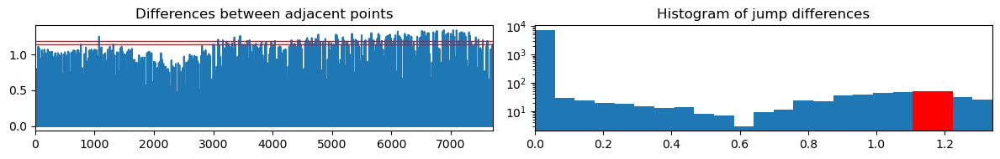



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (7707,)
computing range... ---> range = (0.09,0.15)
displaying jump_fig for switch parameter = s3



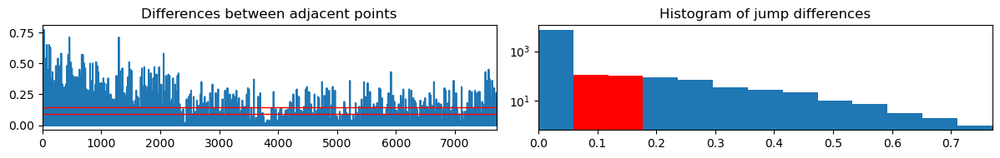



--- end of switch param: s3 ---

---> switch parameter found: s1 <---
finding differences within range = (0.77,0.83)
Jump points detected: 57
out of total: ~400.0

computing offset...


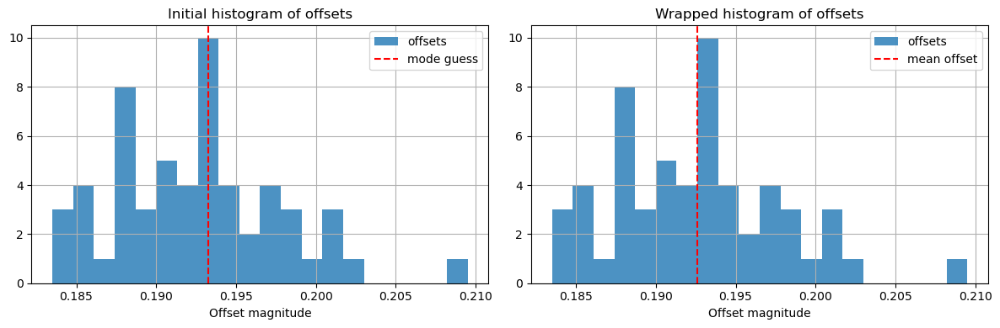



offset = 0.193 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of 0.013 seconds over 12000.0 switches
Corrected Switch Time = 0.2500011


In [16]:
filename = DATA + 'Whole_setup/10-30/PAX_10-30_ARL_Orth_1345_desktop.csv'
ds_1345 = SwitchSet(filename, set_range=(0,0.04), skip_default_signal_baseline=20)
ds_1345.find_switches(nominal_switch_rate=2, print_process=True)

In [30]:
ds_1345.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 0 observations with <4 points (out of total 15264 observations)

--- interpolating data ---
length before: 7632
length after: 7632
0 total added
--- end interpolating data ---

--- interpolating data ---
length before: 7632
length after: 7632
0 total added
--- end interpolating data ---
Signal 1 size=7632	Signal 1 range: t=(20.55,3836.07)
Signal 2 size=7632	Signal 2 range: t=(20.30,3835.82)
=== end average_data ===


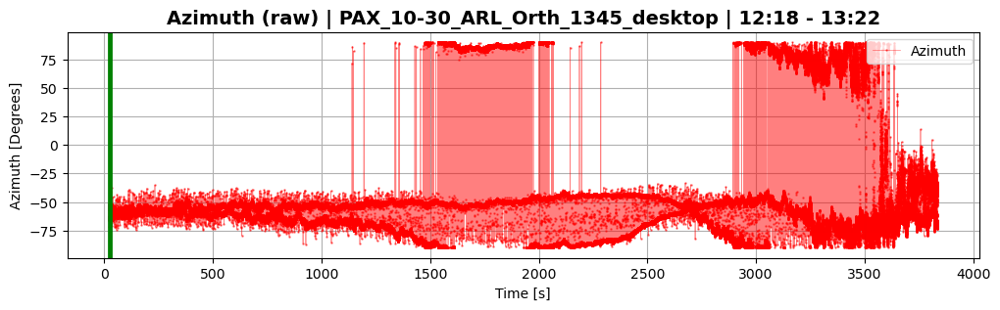

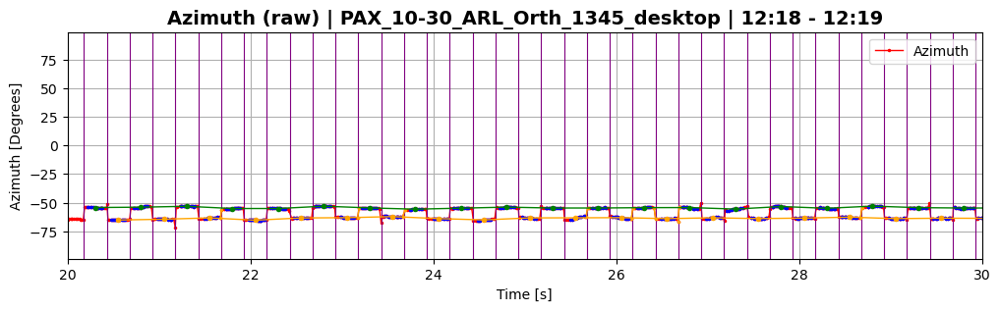

In [31]:
ds_1345.plot_raw(plot_param='Azimuth', sample_range=(20,30),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

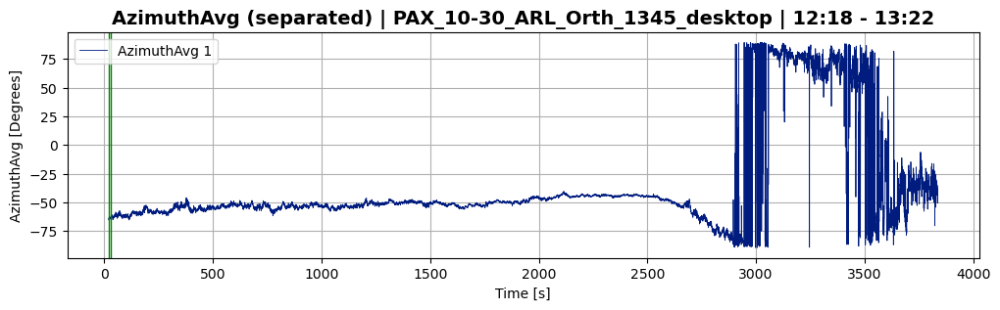

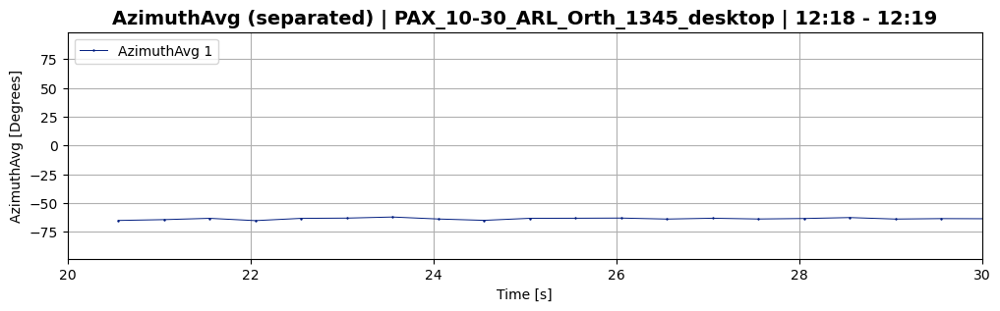

In [32]:
ds_1345.plot_separated(plot_param='AzimuthAvg',plot_signal=1,sample_range=(20,30))

In [43]:
reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=20, print_process=True);

Using "resetting reference SOPs" approach with threshold = 20.0 degrees


/tmp/ipykernel_137629/1855016075.py:983: RuntimeWarning:

invalid value encountered in arccos



Reference matrix was reset 351 times
Reset at time t=183.93
Reset at time t=678.43
Reset at time t=686.93
Reset at time t=1313.43
Reset at time t=1474.94
Reset at time t=1686.44
Reset at time t=1836.94
Reset at time t=2110.94
Reset at time t=2324.94
Reset at time t=2454.94
...


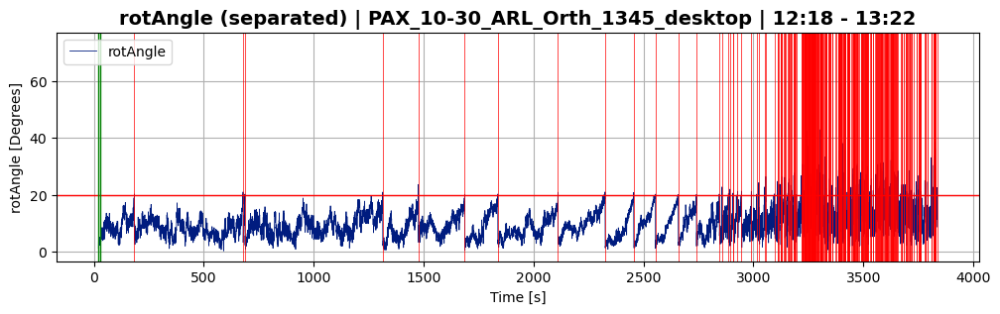

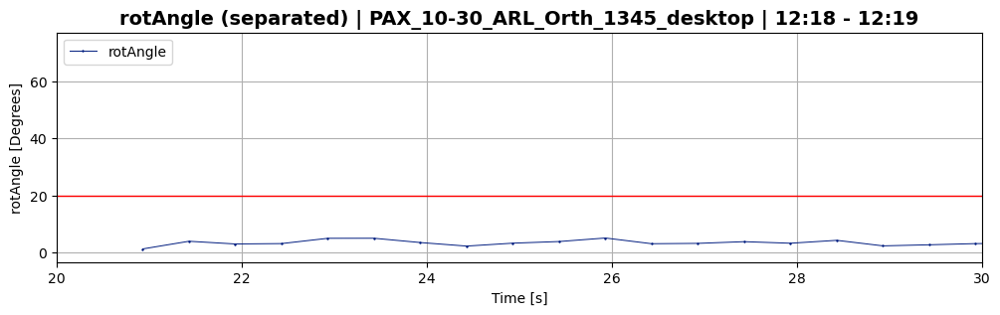

In [44]:
ds_1345.plot_separated(plot_param='rotAngle',sample_range=(20,30))

##### 1560 dataset

Time range: min=20.005, max=4035.361
Determining change point ranges automatically...
Using change_point_range_1=(20.005, 120.005)
Using change_point_range_2=(3020.005, 3120.005)
=== performing change point detection ===
cp range: (20.005, 120.005)
using 5029 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5029,)
computing range... ---> range = (0.09,0.15)
displaying jump_fig for switch parameter = s1



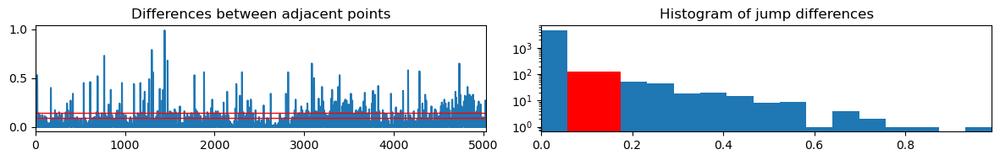



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5029,)
computing range... ---> range = (1.03,1.08)
displaying jump_fig for switch parameter = s2



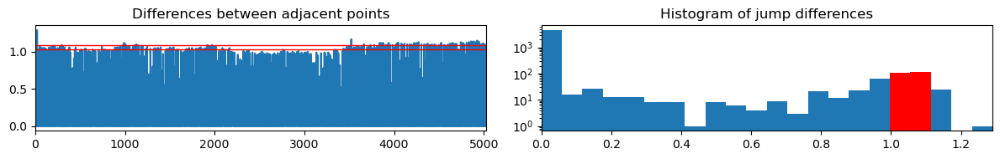



found width of 0.059 for s2
greater than prev width of 0.058 for s1
--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5029,)
computing range... ---> range = (0.92,0.98)
displaying jump_fig for switch parameter = s3



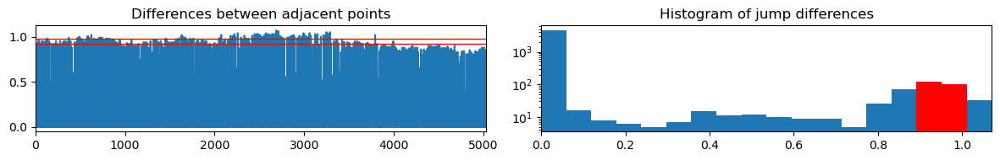



found width of 0.059 for s3
greater than prev width of 0.059 for s2
--- end of switch param: s3 ---

---> switch parameter found: s3 <---
finding differences within range = (0.92,0.98)
Jump points detected: 122
out of total: ~399.9

computing offset...


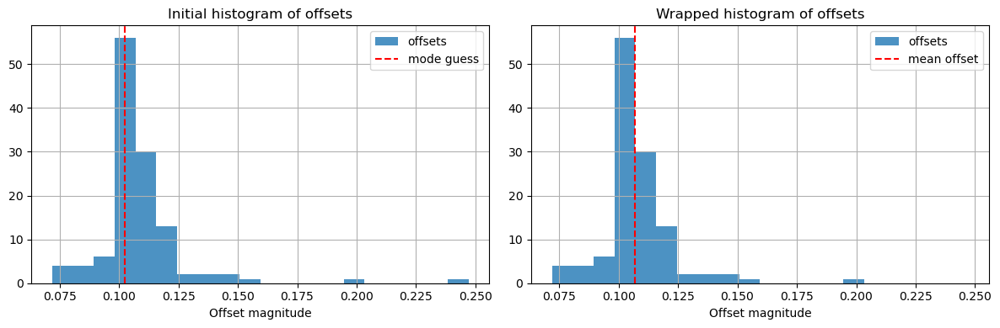



offset = 0.107 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (3020.005, 3120.005)
using 5168 data entries
skipping 150647 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5168,)
computing range... ---> range = (1.13,1.19)
displaying jump_fig for switch parameter = s1



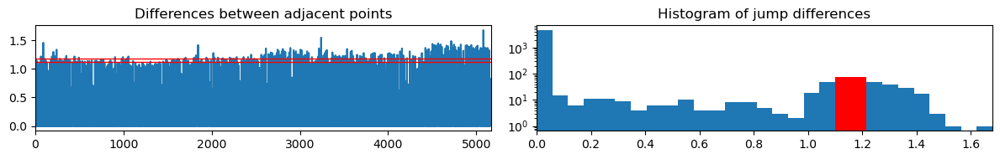



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5168,)
computing range... ---> range = (0.08,0.14)
displaying jump_fig for switch parameter = s2



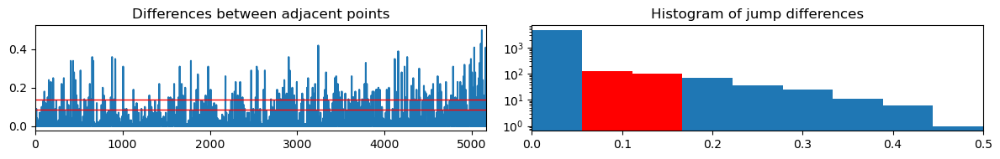



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5168,)
computing range... ---> range = (0.80,0.86)
displaying jump_fig for switch parameter = s3



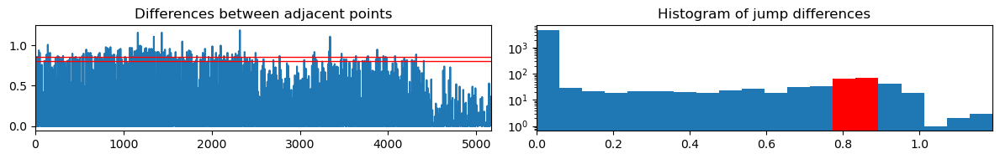



found width of 0.059 for s3
greater than prev width of 0.058 for s1
--- end of switch param: s3 ---

---> switch parameter found: s3 <---
finding differences within range = (0.80,0.86)
Jump points detected: 79
out of total: ~399.8

computing offset...


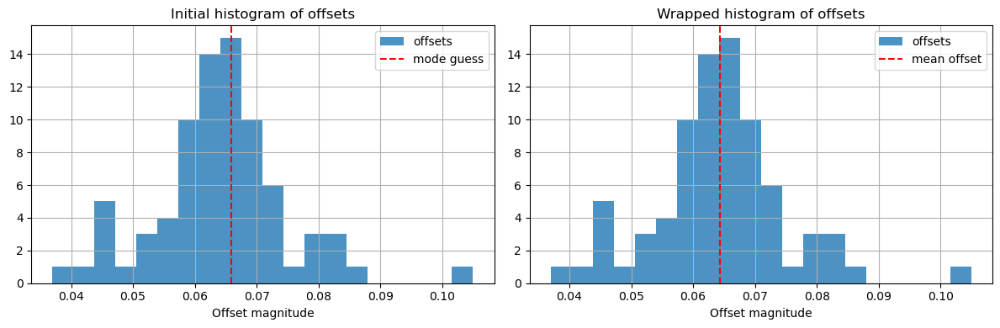



offset = 0.064 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of -0.043 seconds over 12000.0 switches
Corrected Switch Time = 0.2499964


In [35]:
filename = 'Datasets/Whole_setup/10-30/PAX_10-30_ARL_Orth_1560_laptop.csv'
ds_1560 = SwitchSet(filename, set_range=(0,0.056), skip_default_signal_baseline=20)
ds_1560.find_switches(nominal_switch_rate=2, print_process=True)

In [36]:
ds_1560.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 834 observations with <4 points (out of total 15847 observations)

--- interpolating data ---
length before: 7499
length after: 8031
532 total added
--- end interpolating data ---

--- interpolating data ---
length before: 7514
length after: 8030
516 total added
--- end interpolating data ---
Signal 1 size=8030	Signal 1 range: t=(20.48,4034.93)
Signal 2 size=8031	Signal 2 range: t=(20.23,4035.18)
=== end average_data ===


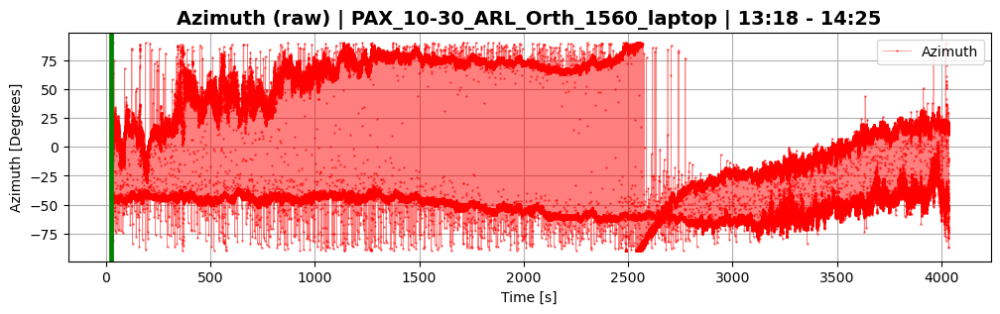

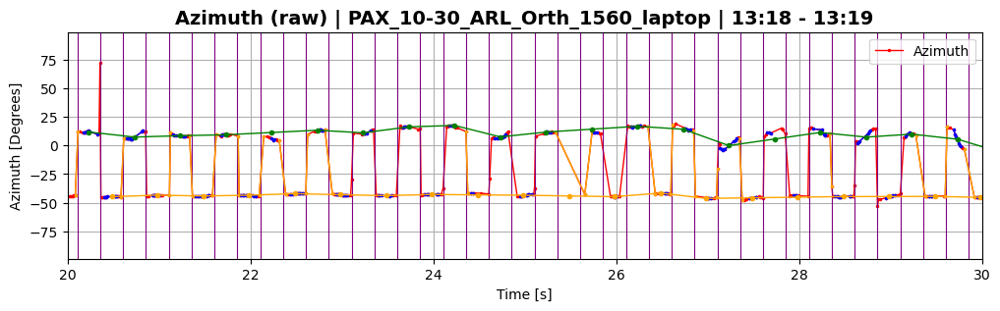

In [37]:
ds_1560.plot_raw(plot_param='Azimuth', sample_range=(20,30),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

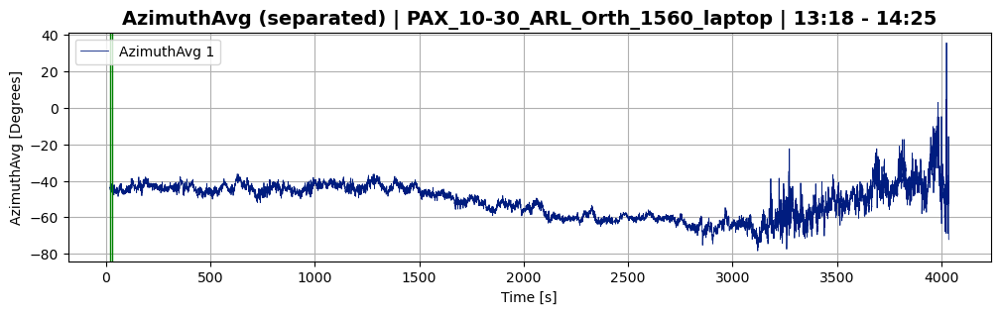

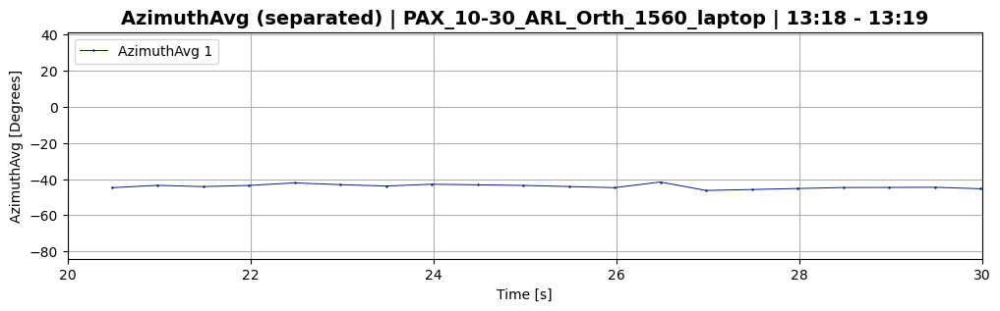

In [38]:
ds_1560.plot_separated(plot_param='AzimuthAvg',plot_signal=1,sample_range=(20,30))

In [45]:
reset_times_1560 = ds_1560.calc_stokes_ptf(reference=reset_times_1345, reset_delay=5, print_process=True);

Using provided reset times to reset reference matrix
Reference matrix was reset 351 times
Reset at time t=189.36
Reset at time t=683.85
Reset at time t=692.35
Reset at time t=1318.84
Reset at time t=1480.34
Reset at time t=1691.83
Reset at time t=1842.33
Reset at time t=2116.33
Reset at time t=2330.32
Reset at time t=2460.32
...


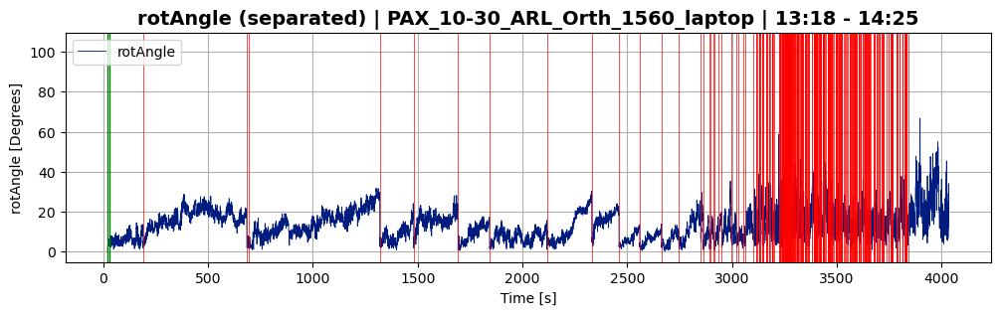

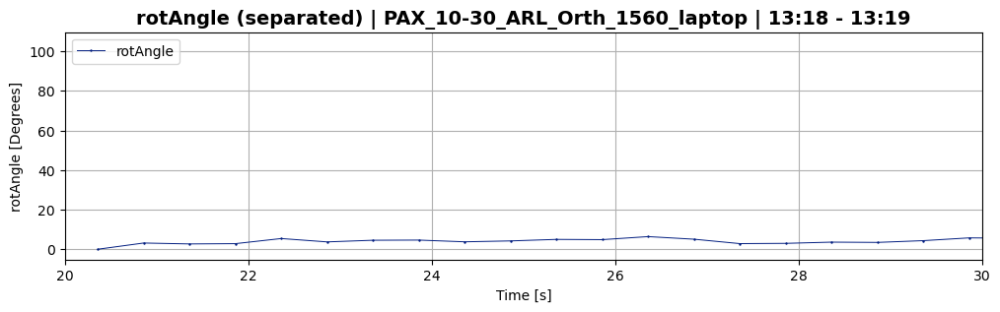

In [46]:
ds_1560.plot_separated(plot_param='rotAngle',sample_range=(20,30))

##### Both 1345 and 1560 rotAngle

In [47]:
ds_arl_10_30 = (ds_1345, ds_1560)

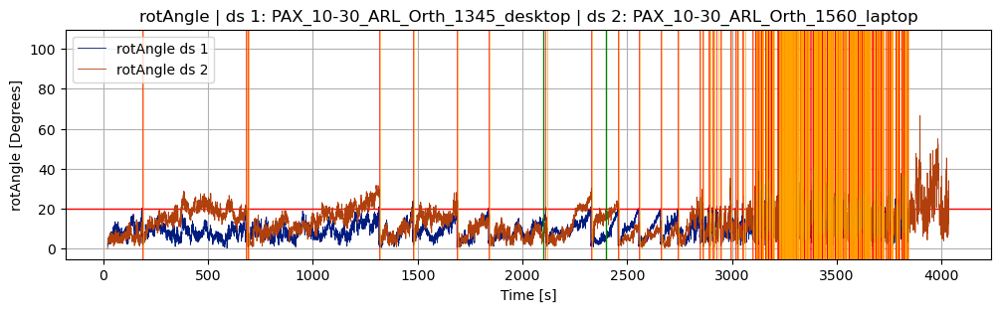

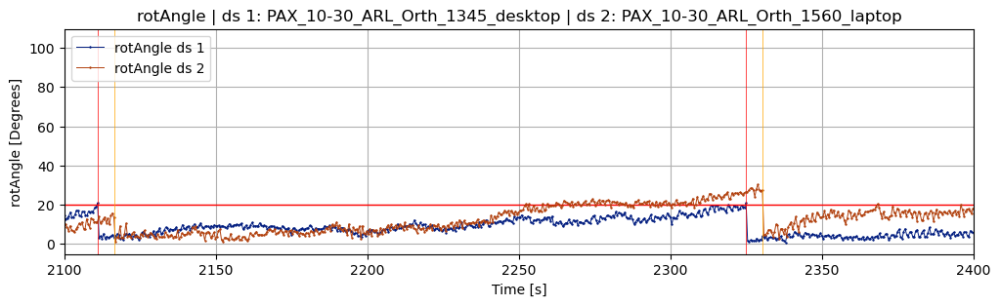

In [77]:
plot_rot_angle(ds_arl_10_30[0], ds_arl_10_30[1], birds_eye=True, sample_range=(2100,2400))

In [78]:
import statistics
statistics.mean(reset_times_1560)

1276.6427284609322

### ARL dataset 24-03-11

##### 1345 dataset

In [5]:
plt.ioff()
plt.close('all')

In [6]:
filename = DATA + 'Whole_setup/24-03-11/PAX_3-11_ARL_Orth_1345_desktop.csv'
ds_test = Dataset(filename,set_range=(0,0.01),skip_default_signal_baseline=False)

Time range: min=0.06, max=887.735


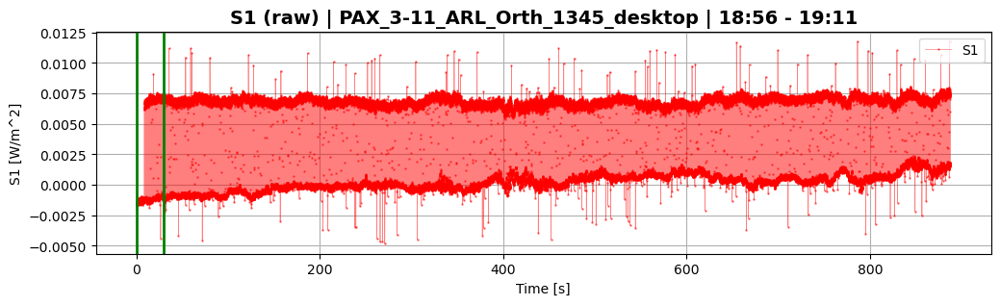

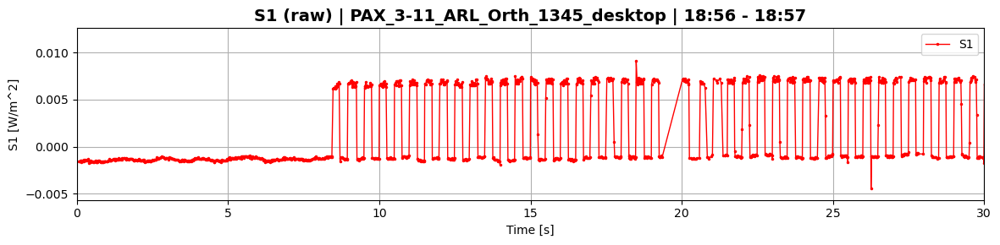

(<Figure size 1200x300 with 1 Axes>, <Figure size 1200x300 with 1 Axes>)

In [7]:
ds_test.plot_raw(plot_param="S1",sample_range=(0,30))

Time range: min=22049.152, max=30954.769
Determining change point ranges automatically...
Using change_point_range_1=(22049.152, 22149.152)
Using change_point_range_2=(25049.152, 25149.152)
=== performing change point detection ===
cp range: (22049.152, 22149.152)
using 5971 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5971,)
computing range... ---> range = (1.19,1.25)
displaying jump_fig for switch parameter = s1



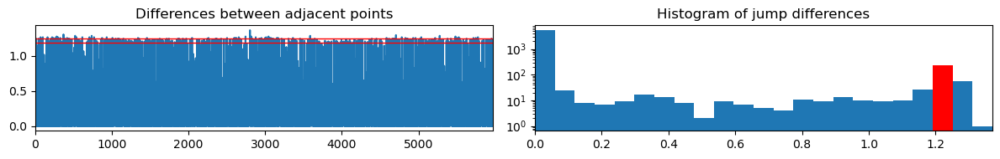



found width of 0.060 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5971,)
computing range... ---> range = (0.43,0.49)
displaying jump_fig for switch parameter = s2



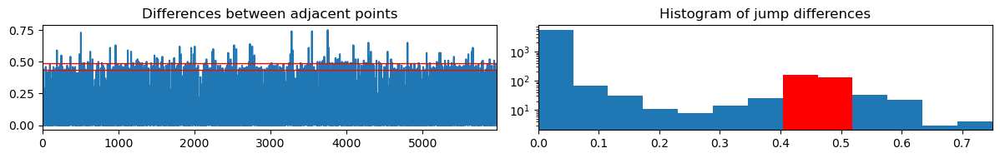



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5971,)
computing range... ---> range = (0.36,0.42)
displaying jump_fig for switch parameter = s3



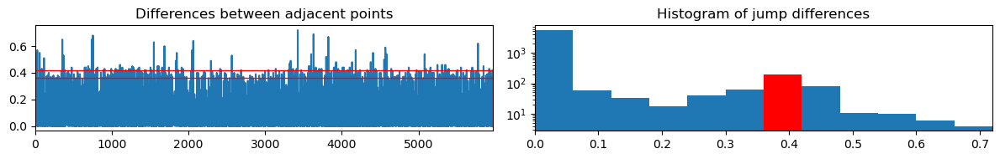



found width of 0.060 for s3
greater than prev width of 0.060 for s1
--- end of switch param: s3 ---

---> switch parameter found: s3 <---
finding differences within range = (0.36,0.42)
Jump points detected: 206
out of total: ~400.0

computing offset...


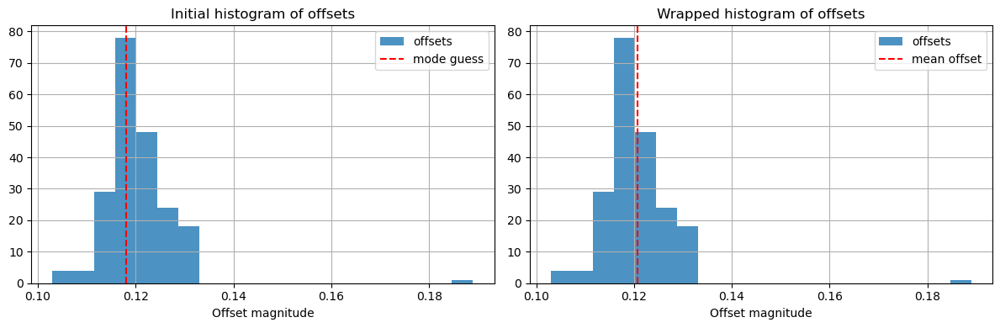



offset = 0.121 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (25049.152, 25149.152)
using 5955 data entries
skipping 179259 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5955,)
computing range... ---> range = (1.32,1.38)
displaying jump_fig for switch parameter = s1



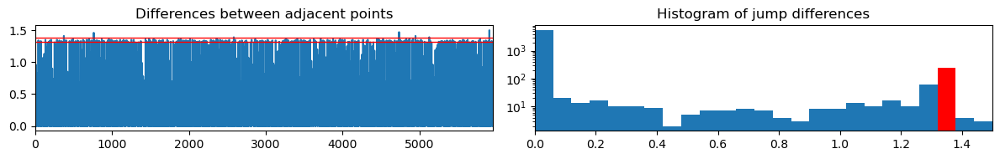



found width of 0.060 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5955,)
computing range... ---> range = (0.28,0.34)
displaying jump_fig for switch parameter = s2



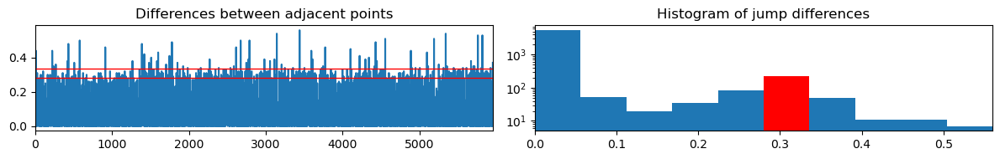



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5955,)
computing range... ---> range = (0.11,0.17)
displaying jump_fig for switch parameter = s3



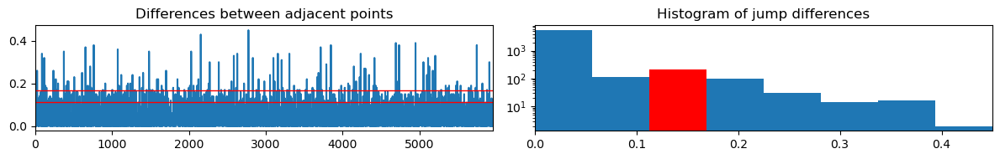



--- end of switch param: s3 ---

---> switch parameter found: s1 <---
finding differences within range = (1.32,1.38)
Jump points detected: 246
out of total: ~399.9

computing offset...


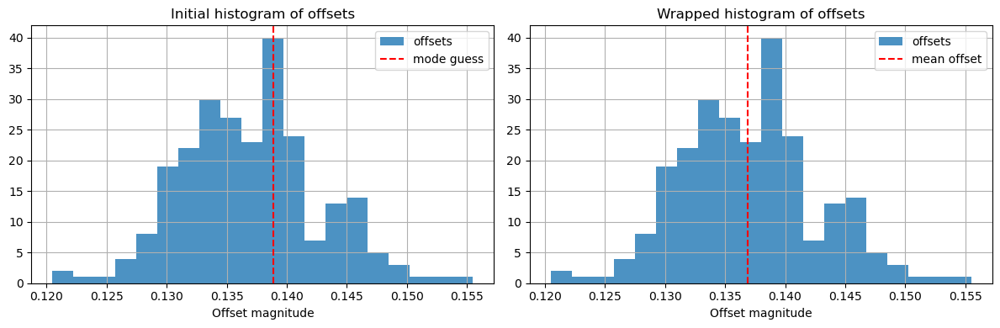



offset = 0.137 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of 0.016 seconds over 12000.0 switches
Corrected Switch Time = 0.2500013


In [117]:
filename = DATA + 'Whole_setup/24-03-11/PAX_3-11_ARL_Orth_1345_desktop.csv'
#ds_1345 = SwitchSet(filename, set_range=(0,0.04), skip_default_signal_baseline=25)
ds_1345 = SwitchSet(filename, set_range=(0.25,0.35), skip_default_signal_baseline=25)
ds_1345.find_switches(nominal_switch_rate=2, print_process=True)

In [118]:
ds_1345.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 35 observations with <4 points (out of total 35592 observations)

--- interpolating data ---
length before: 17776
length after: 17810
34 total added
--- end interpolating data ---

--- interpolating data ---
length before: 17781
length after: 17811
30 total added
--- end interpolating data ---
Signal 1 size=17810	Signal 1 range: t=(22049.75,30954.29)
Signal 2 size=17811	Signal 2 range: t=(22049.50,30954.54)
=== end average_data ===


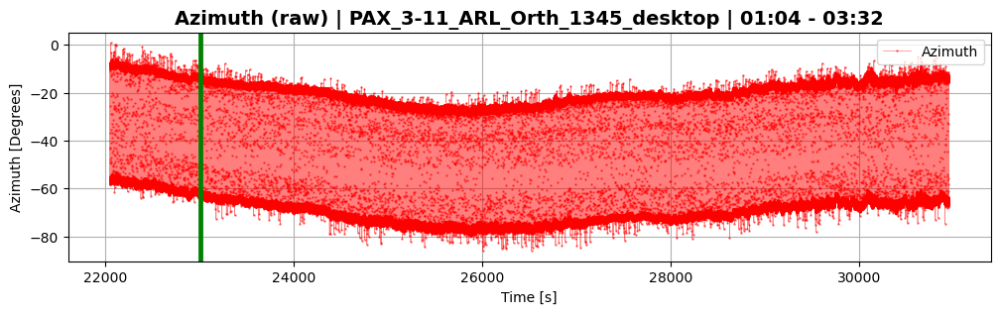

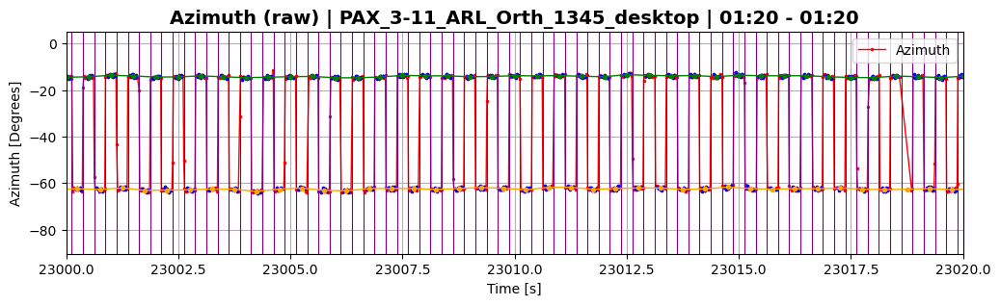

In [119]:
ds_1345.plot_raw(plot_param='Azimuth', sample_range=(23000,23020),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

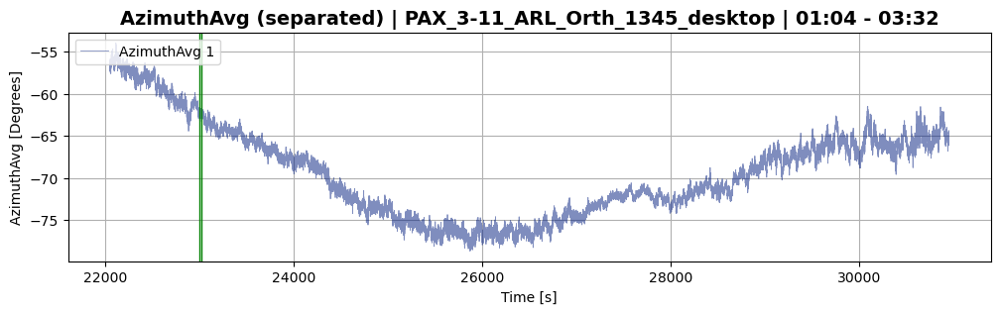

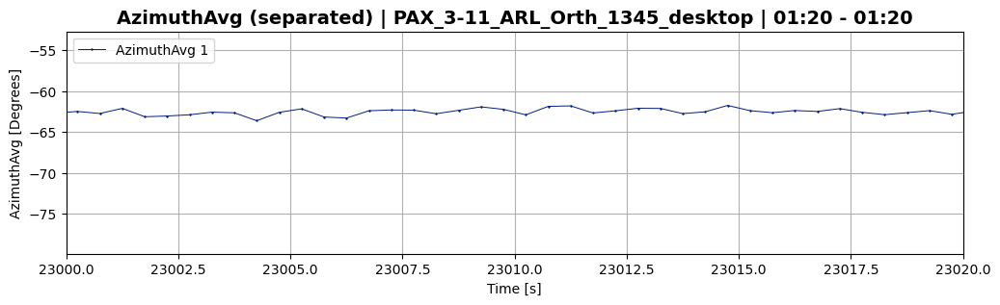

In [120]:
ds_1345.plot_separated(plot_param='AzimuthAvg',plot_signal=1,sample_range=(23000,23020))

In [121]:
reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=10, reset_by_rolling=True, rolling_pts=30, print_process=True);

Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Reference matrix was reset 6 times
Reset at time t=22762.62
Reset at time t=23725.63
Reset at time t=24626.13
Reset at time t=28858.16
Reset at time t=30092.66
Reset at time t=30360.17


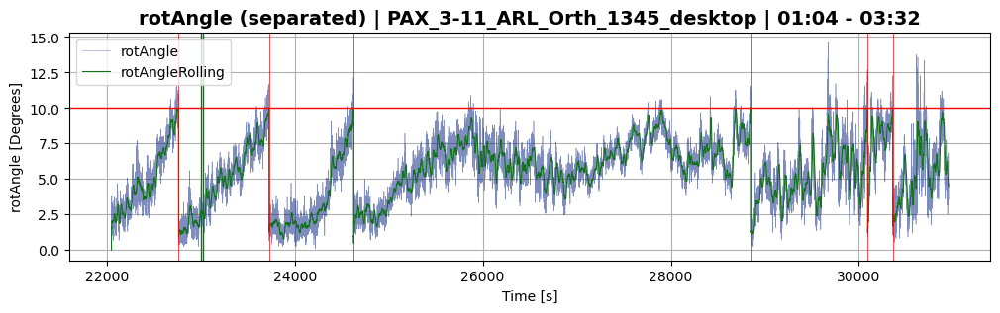

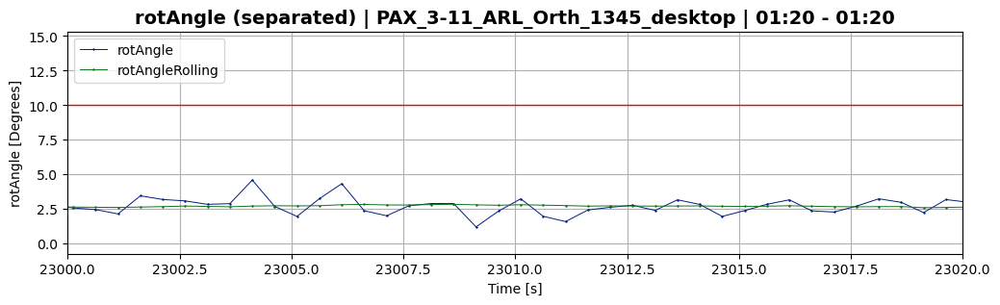

In [122]:
ds_1345.plot_separated(plot_param='rotAngle',sample_range=(23000,23020))

##### 1560 dataset

Time range: min=22651.678, max=31719.131
Determining change point ranges automatically...
Using change_point_range_1=(22651.678, 22751.678)
Using change_point_range_2=(25651.678, 25751.678)
=== performing change point detection ===
cp range: (22651.678, 22751.678)
using 5869 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5869,)
computing range... ---> range = (0.21,0.27)
displaying jump_fig for switch parameter = s1



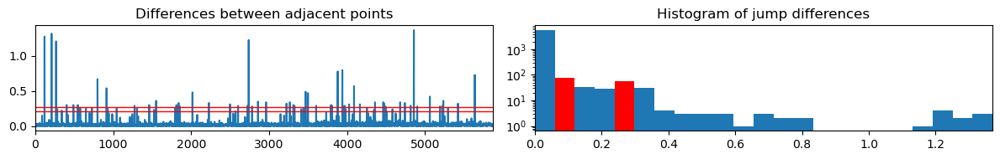



found width of 0.060 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5869,)
computing range... ---> range = (0.15,0.21)
displaying jump_fig for switch parameter = s2



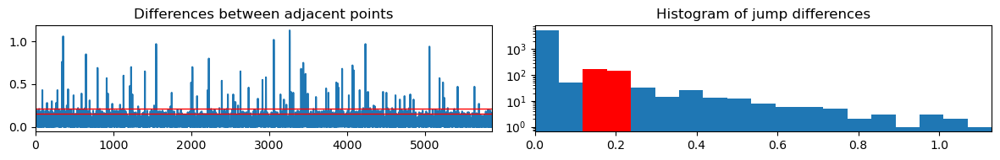



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5869,)
computing range... ---> range = (1.38,1.44)
displaying jump_fig for switch parameter = s3



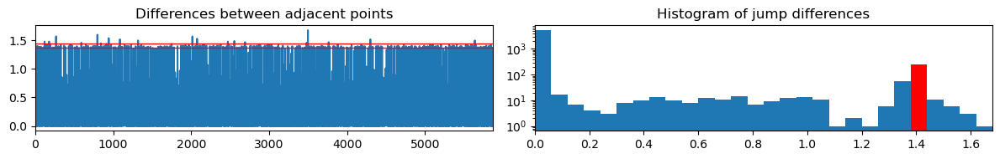



found width of 0.060 for s3
greater than prev width of 0.060 for s1
--- end of switch param: s3 ---

---> switch parameter found: s3 <---
finding differences within range = (1.38,1.44)
Jump points detected: 247
out of total: ~400.0

computing offset...


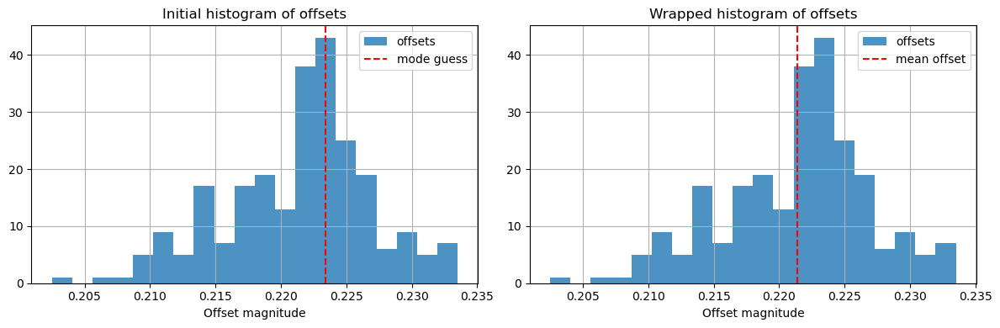



offset = 0.221 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (25651.678, 25751.678)
using 5902 data entries
skipping 176401 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5902,)
computing range... ---> range = (0.15,0.20)
displaying jump_fig for switch parameter = s1



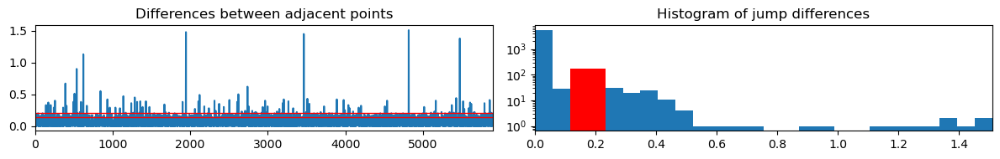



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5902,)
computing range... ---> range = (0.06,0.12)
displaying jump_fig for switch parameter = s2



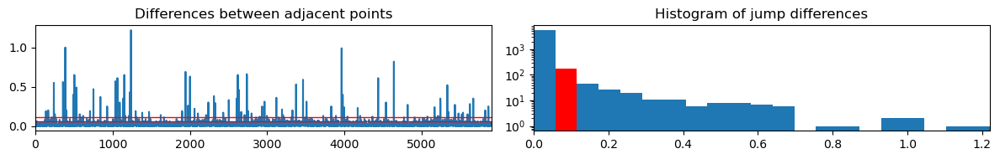



found width of 0.058 for s2
greater than prev width of 0.058 for s1
--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5902,)
computing range... ---> range = (1.36,1.42)
displaying jump_fig for switch parameter = s3



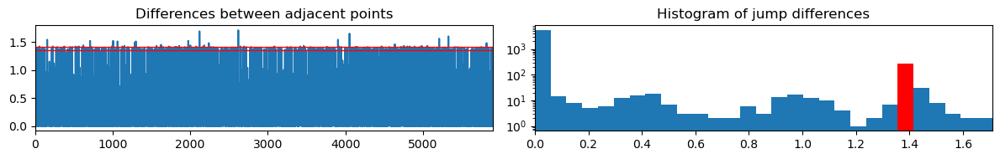



found width of 0.059 for s3
greater than prev width of 0.058 for s2
--- end of switch param: s3 ---

---> switch parameter found: s3 <---
finding differences within range = (1.36,1.42)
Jump points detected: 277
out of total: ~400.0

computing offset...


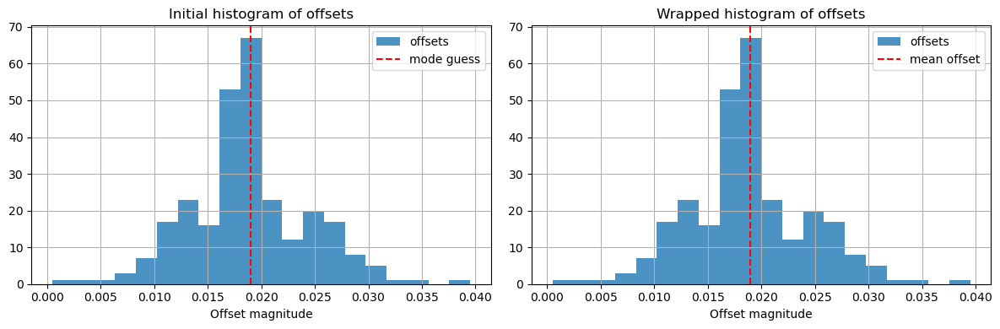



offset = 0.019 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of 0.048 seconds over 12000.0 switches
Corrected Switch Time = 0.2500040


In [123]:
filename = DATA + 'Whole_setup/24-03-11/PAX_3-11_ARL_Orth_1560_laptop.csv'
ds_1560 = SwitchSet(filename, set_range=(0.25,0.35), skip_default_signal_baseline=25)
ds_1560.find_switches(nominal_switch_rate=2, print_process=True)

In [124]:
ds_1560.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 0 observations with <4 points (out of total 36264 observations)

--- interpolating data ---
length before: 18133
length after: 18134
1 total added
--- end interpolating data ---

--- interpolating data ---
length before: 18131
length after: 18133
2 total added
--- end interpolating data ---
Signal 1 size=18134	Signal 1 range: t=(22652.10,31718.74)
Signal 2 size=18133	Signal 2 range: t=(22652.35,31718.49)
=== end average_data ===


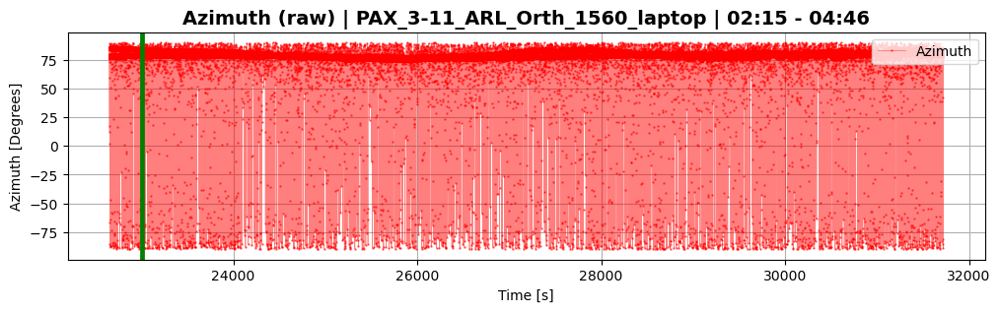

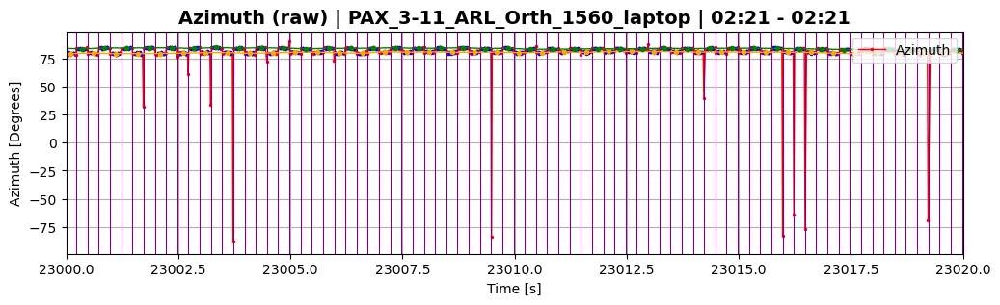

In [125]:
ds_1560.plot_raw(plot_param='Azimuth', sample_range=(23000,23020),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

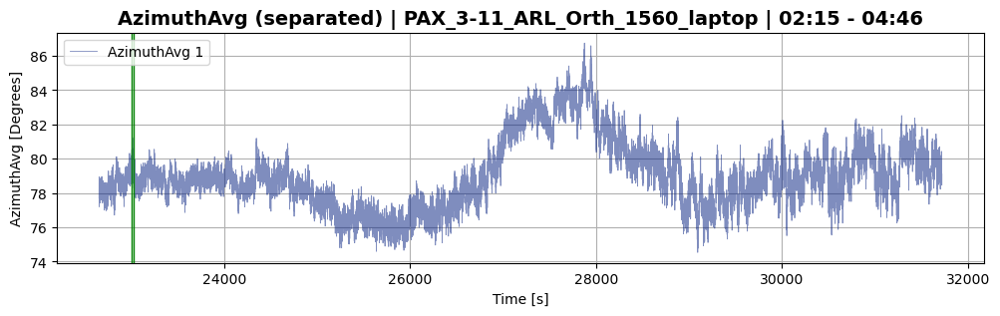

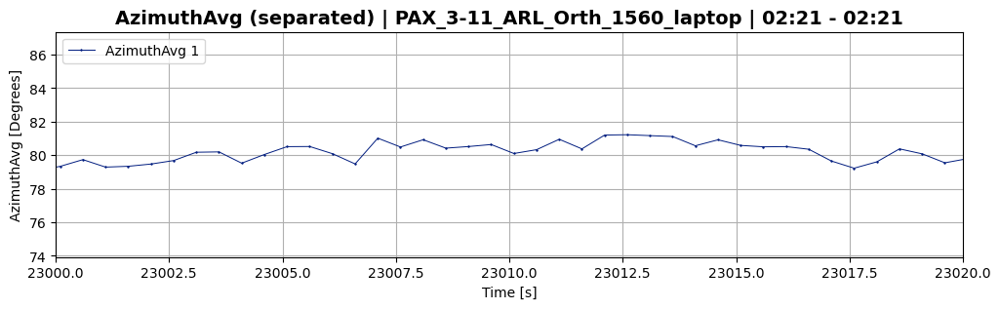

In [126]:
ds_1560.plot_separated(plot_param='AzimuthAvg',plot_signal=1,sample_range=(23000,23020))

In [127]:
reset_times_1560 = ds_1560.calc_stokes_ptf(reference=reset_times_1345, rolling_pts=30, print_process=True);

Using provided reset times to reset reference matrix
Reference matrix was reset 6 times
Reset at time t=22762.72
Reset at time t=23725.74
Reset at time t=24626.25
Reset at time t=28858.32
Reset at time t=30092.84
Reset at time t=30360.34


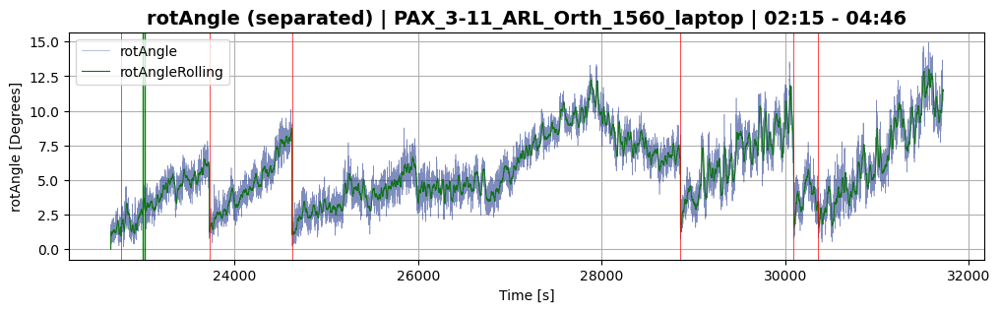

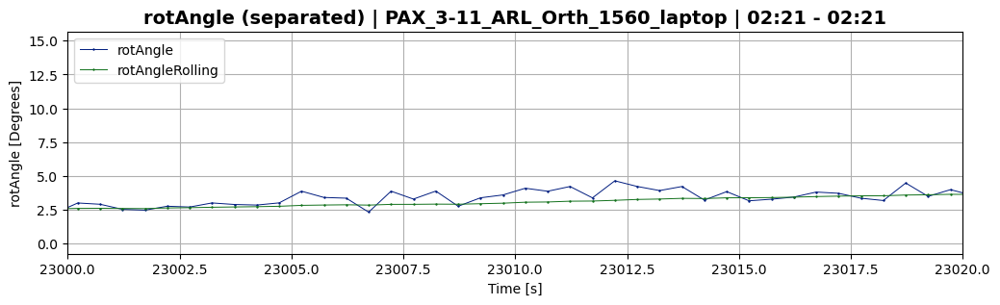

In [128]:
ds_1560.plot_separated(plot_param='rotAngle',sample_range=(23000,23020))

##### Both 1345 and 1560 rotAngle

In [129]:
ds_arl_24_03_11 = (ds_1345, ds_1560)

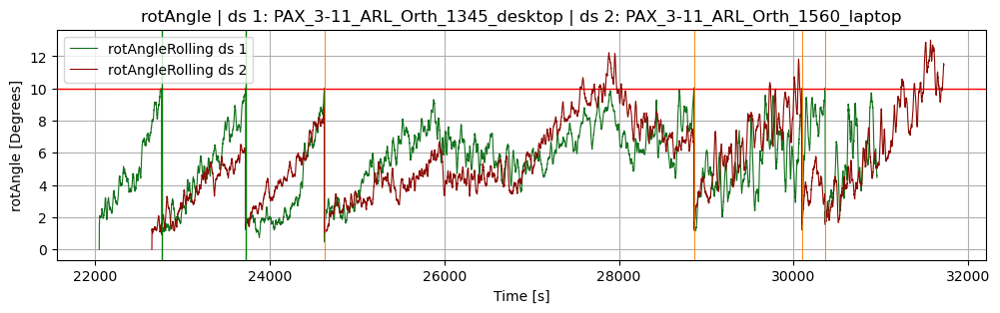

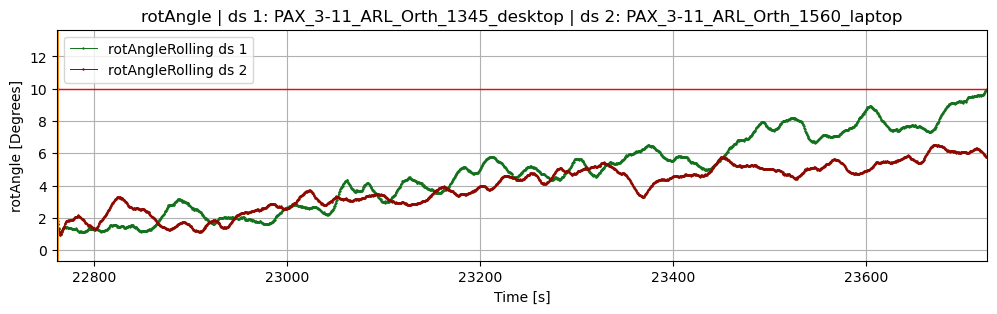

In [131]:
plot_rot_angle(ds_arl_24_03_11[0], ds_arl_24_03_11[1], birds_eye=True, sample_range=(22762,23725), plot_raw=False)

In [57]:
import statistics
print(statistics.mean(np.diff(reset_times_1560)))
print(statistics.stdev(np.diff(reset_times_1560)))

431.63842010612296
485.57531466901867


In [66]:
rolling_pts = 4
current_segment_values = [1.0, 2.0, 3.0, 4.0, 5.0]
if len(current_segment_values) <= rolling_pts:
    print(sum(current_segment_values) / len(current_segment_values))
else:
    print(sum(current_segment_values[-rolling_pts:]) / rolling_pts)

3.5
